 # Road Sign Recognition system

In [89]:
import pathlib as path
import skimage as skimg
import matplotlib.pyplot as plt
from functional import seq
from random import sample, seed
import numpy as np
from rsr import Data
from loguru import logger
import Augmentor
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import confusion_matrix
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn import svm as SVM
from mpl_toolkits import mplot3d
from sklearn.metrics import classification_report

logger.remove()

 # Loading dataset
 Load the data from the `/cropped/` directory, convert the directory name to integer and used them as labels

In [12]:
def loadDataset():
    paths = path.Path('.').glob('./cropped/**/*.jpg')
    dataset = []
    for p in paths:
        dataset.append(Data(p))
    return dataset

def groupDataset(dataset):
    groups = seq(dataset).group_by(lambda data: data.label)
    return groups

dataset = loadDataset()
groups = groupDataset(dataset)


 # Dataset distribution

No entry: 26
One way: 97
Speed bump: 230
Stop: 147
Total: 500


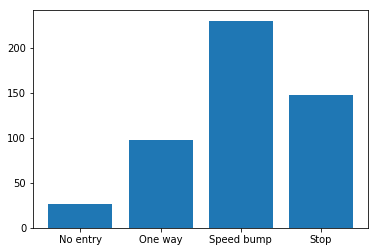

In [13]:
def printStat(dataset, groups):
    for group in groups:
        print(f'{Data.fromIndex(group[0])}: {len(group[1])}')
    print(f'Total: {len(dataset)}')

    plt.bar(seq(groups).select(lambda group: Data.fromIndex(group[0])).to_list(), seq(groups).select(lambda group: len(group[1])).to_list())
    plt.show()

printStat(dataset, groups)

 # Visualizing dataset
 Displaying 10 random samples for each label

 _Here, the random seed is set to 0_

In [14]:
seed(0)

def showImages(images, title, cols = 10, figsize = (15, 15), y = 0.6):
    rows = len(images) // cols
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    cmap = None
    for axe, image in zip(axes.ravel(), images):
        axe.axis('off')
        if len(image.shape) < 3 or image.shape[-1] < 3:
            cmap = "gray"
        axe.imshow(image, cmap = cmap)
    
    fig.suptitle(title, y=y)
    plt.show()
    return

def showDataset(dataset, title, cols = 10, figsize = (15, 15), y = 0.6):
    showImages(seq(dataset).select(lambda data: data.image).to_list(), title, cols, figsize, y)
    
def sampleDataset(dataset, count=10):
    groups = groupDataset(dataset)
    for group in groups:
        showDataset(sample(group[1], count), Data.fromIndex(group[0]), cols=count)
    return


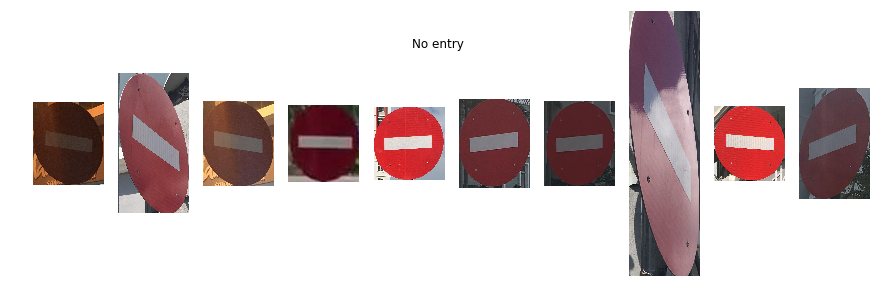

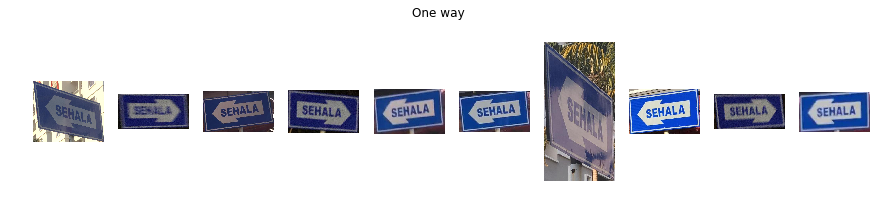

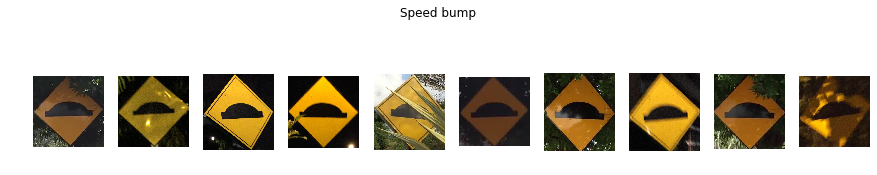

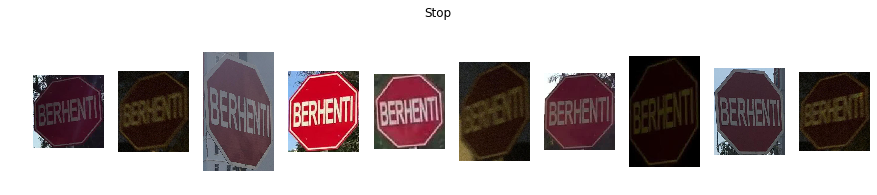

In [15]:
sampleDataset(dataset)

 # Image preprocessing

In [16]:
def minMaxAverage(title, items):
    print(f'Minimum {title}: {seq(items).min()}')
    print(f'Maximum {title}: {seq(items).max()}')
    print(f'Average {title}: {seq(items).average()}')

 Average width

In [17]:
minMaxAverage("width", seq(dataset).select(lambda data: data.image.shape[0]))


Minimum width: 74
Maximum width: 1367
Average width: 457.67


 Average height

In [18]:
minMaxAverage("height", seq(dataset).select(lambda data: data.image.shape[1]))


Minimum height: 65
Maximum height: 2527
Average height: 464.48


 # Validation set
 Here, we only sample 100 images for testing out the preprocessing steps

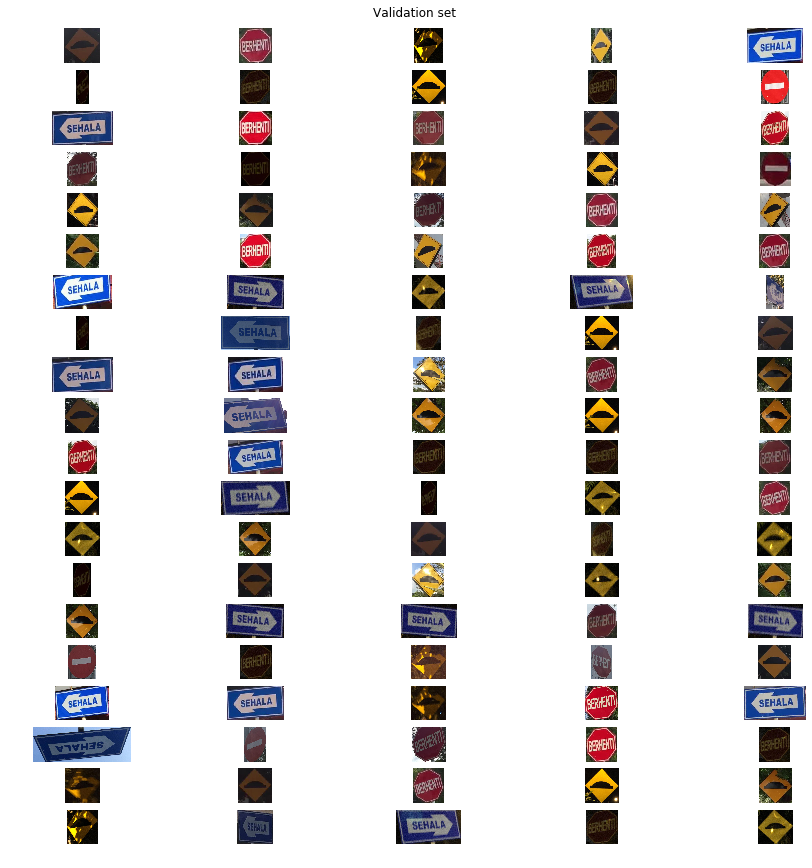

In [19]:
# validation set
validationSet = sample(dataset, 100)
showDataset(validationSet, "Validation set", 5, y = 0.9)

 Grayscale

C:\Users\GaryNg\Anaconda3\lib\site-packages\skimage\util\dtype.py:141: UserWarning: Possible precision loss when converting from float64 to uint8
  .format(dtypeobj_in, dtypeobj_out))


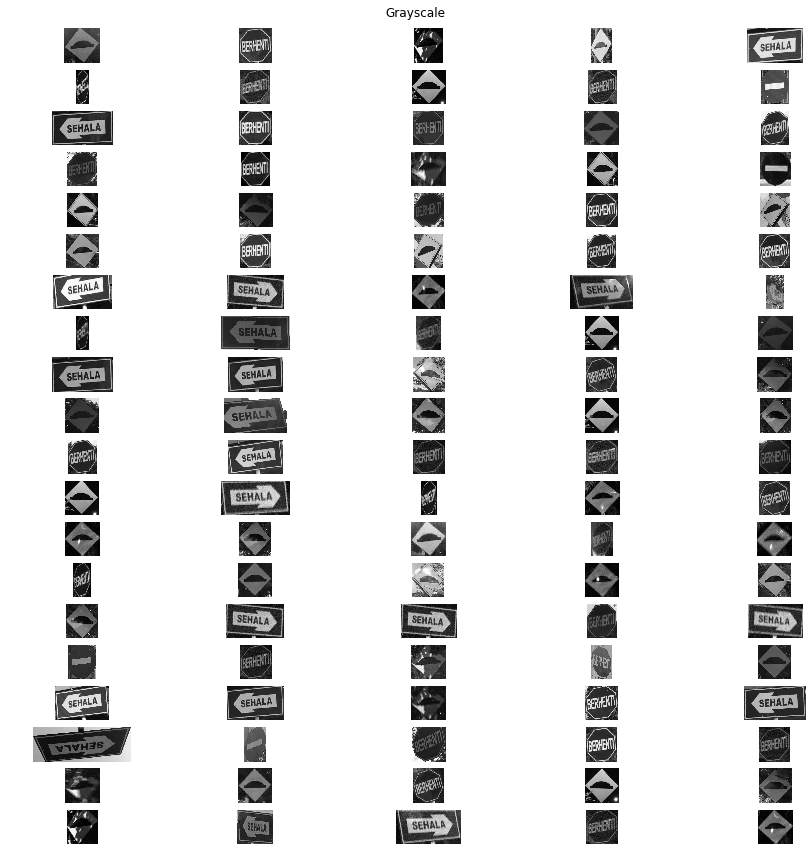

In [20]:
for data in validationSet:
    data.grayscale()

showDataset(validationSet, "Grayscale", 5, y = 0.9)


 Histogram equalization

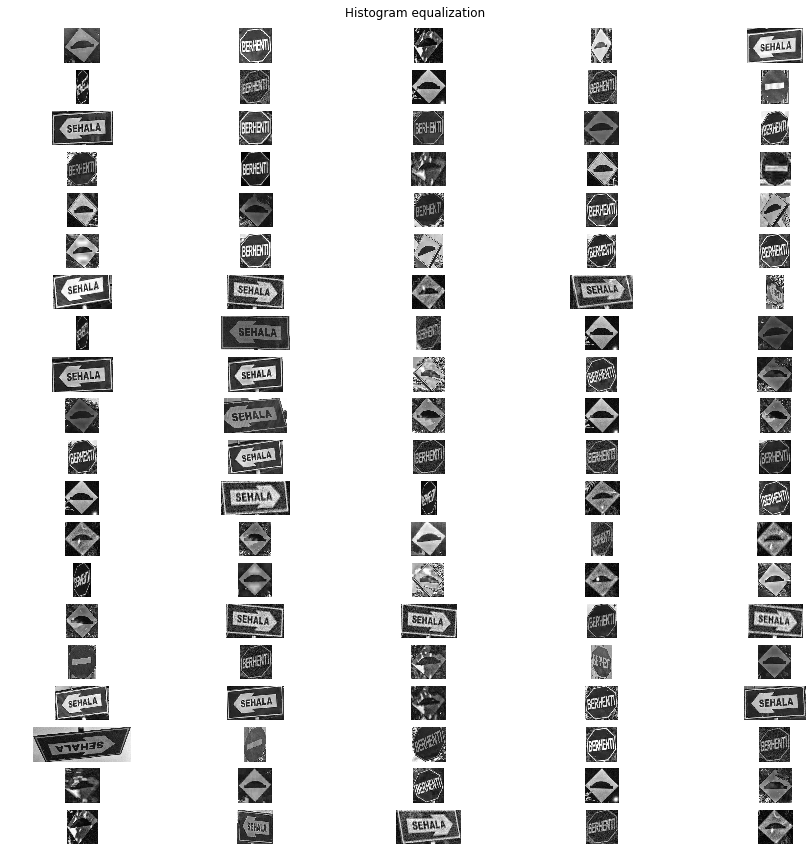

In [21]:
for data in validationSet:
    data.equalize()

showDataset(validationSet, "Histogram equalization", 5, y = 0.9)

 Resize

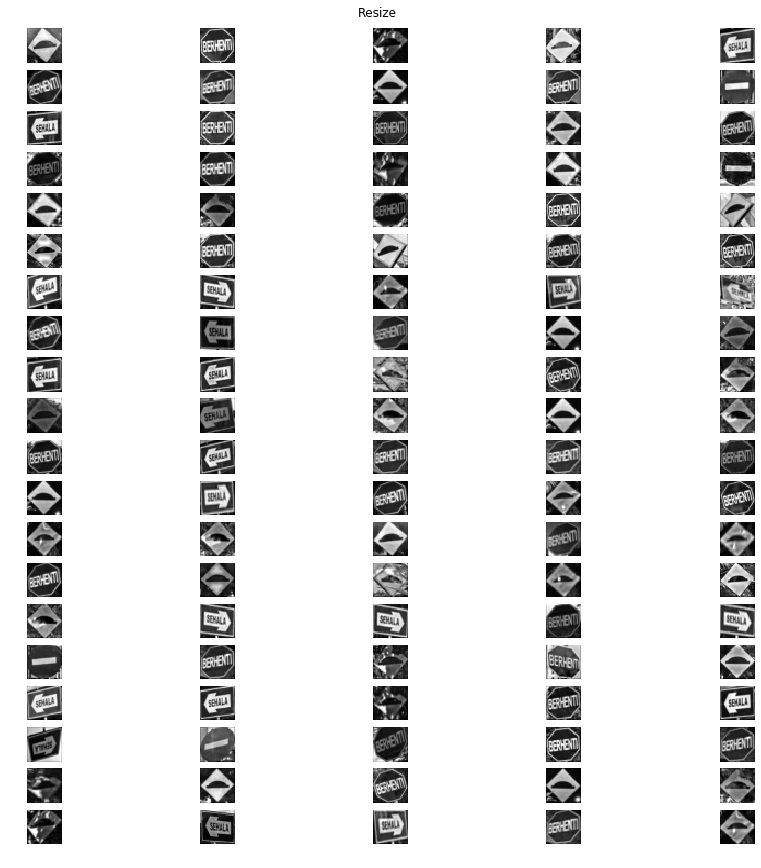

In [22]:
for data in validationSet:
    data.resize()

showDataset(validationSet, "Resize", 5, y = 0.9)

 Final width

In [23]:
minMaxAverage("width", seq(validationSet).select(lambda data: data.image.shape[0]))

Minimum width: 32
Maximum width: 32
Average width: 32.0


 Final height

In [24]:
minMaxAverage("height", seq(validationSet).select(lambda data: data.image.shape[1]))

Minimum height: 32
Maximum height: 32
Average height: 32.0


 Pickling preprocessed data

In [25]:
import pickle

def pickleData():
    dataset = loadDataset()
    for data in dataset:
        data.preprocess()

    images, labels = getDataLabelsFromDataset(dataset)

    print(images.shape)
    print(labels.shape)

    pickle.dump(images, open('./pkl/images.pkl', 'wb'))
    pickle.dump(labels, open('./pkl/labels.pkl', 'wb'))


In [26]:
def unpickleData():
    images = pickle.load(open("./pkl/images.pkl", "rb"))
    labels = pickle.load(open("./pkl/labels.pkl", "rb"))
    return (images, labels)

In [27]:
def getData():
    """Return unpicked data seperated into training and testing sets"""
    return train_test_split(*unpickleData(), random_state=123)

In [28]:
def scatter3d(x, y, z, labels):
    ax = plt.axes(projection='3d')
    ax.scatter(x, y, z, c = labels) 
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])
    plt.show()

## Model 1: k-NN

In [29]:
def crossValidateKnn(data, labels):
    scores = []
    neighbours = seq(range(1, 50)).filter(lambda i: i % 2 == 1).to_list()
    for k in neighbours:
        knn = KNeighborsClassifier(n_neighbors=k)
        # 10-fold
        scores.append(cross_val_score(knn, data, labels, cv=10, scoring='accuracy').mean())

    mse = [1 - x for x in scores] # miss-classification error
    plt.xlabel('k')
    plt.ylabel('error rate')
    plt.plot(neighbours, mse)

    optimalK = neighbours[mse.index(min(mse))]
    print(f'optimal k: {optimalK}')

    return optimalK

In [30]:
def trainKnn(trainingData, testingData, trainingLabels, testingLabels):

    print(f'trainingData: {trainingData.shape}, trainingLabels: {trainingLabels.shape}')
    print(f'testingData: {testingData.shape}, testingLabels: {testingLabels.shape}')

    k = crossValidateKnn(trainingData, trainingLabels)

    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(trainingData, trainingLabels)
    print(f'training accuracy: {knn.score(trainingData, trainingLabels)}')
    print(f'testing accuracy: {knn.score(testingData, testingLabels)}')
    
    predictedLabels = knn.predict(testingData)
    print(f'confusion matrix: \n {confusion_matrix(testingLabels, predictedLabels)}')
    print(classification_report(testingLabels, predictedLabels))

trainingData: (375, 1024), trainingLabels: (375,)
testingData: (125, 1024), testingLabels: (125,)
optimal k: 1
training accuracy: 1.0
testing accuracy: 0.984
confusion matrix: 
 [[ 7  0  0  1]
 [ 1 22  0  0]
 [ 0  0 67  0]
 [ 0  0  0 27]]
              precision    recall  f1-score   support

           0       0.88      0.88      0.88         8
           1       1.00      0.96      0.98        23
           2       1.00      1.00      1.00        67
           3       0.96      1.00      0.98        27

   micro avg       0.98      0.98      0.98       125
   macro avg       0.96      0.96      0.96       125
weighted avg       0.98      0.98      0.98       125



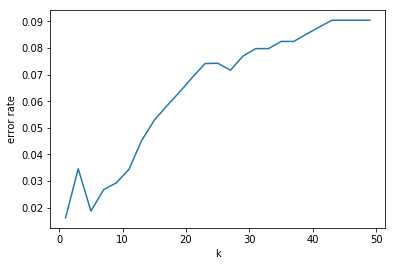

In [31]:
trainKnn(*getData())

# Model 2: PCA-kNN

In [32]:
def fitPca(trainingData, testingData, trainingLabels, testingLabels, components=64, size=(32, 32)):
    
    print(f'trainingData: {trainingData.shape}, trainingLabels: {trainingLabels.shape}')
    print(f'testingData: {testingData.shape}, testingLabels: {testingLabels.shape}')

    scaler = StandardScaler()
    trainingData = scaler.fit_transform(trainingData)
    testingData = scaler.fit_transform(testingData)

    pca = PCA(n_components=components, svd_solver='randomized', whiten=True)
    pca.fit(trainingData)

    print(f'total explained variance: {pca.explained_variance_ratio_[:components].sum()}')
    plt.plot(np.cumsum(pca.explained_variance_ratio_))
    plt.xlabel('number of components')
    plt.ylabel('cumulative explained variance')
    plt.show()
    print(f'pca components: {pca.components_.shape}')
    showImages(pca.components_.reshape(-1, size[0], size[1]), "components", y=0.9)

    trainingData = pca.transform(trainingData)
    testingData = pca.transform(testingData)
    
    return (trainingData, testingData, trainingLabels, testingLabels)

trainingData: (375, 1024), trainingLabels: (375,)
testingData: (125, 1024), testingLabels: (125,)
total explained variance: 0.9442995795943376


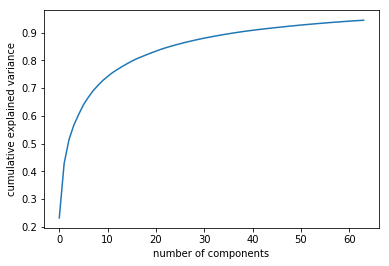

pca components: (64, 1024)


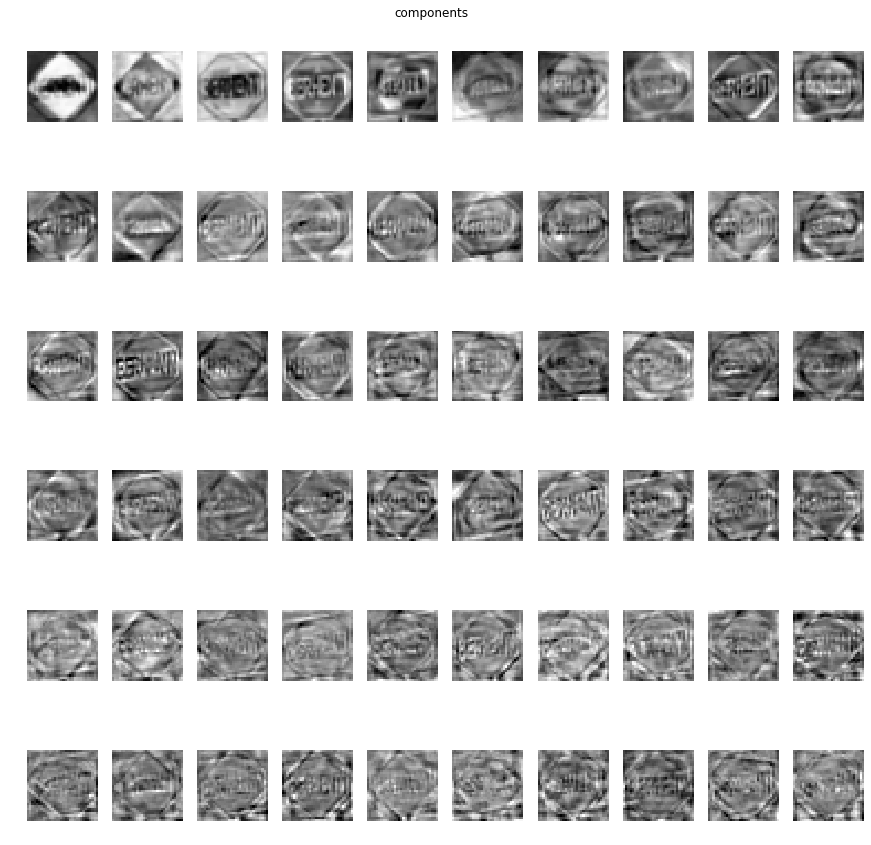

trainingData: (375, 64), trainingLabels: (375,)
testingData: (125, 64), testingLabels: (125,)
optimal k: 1
training accuracy: 1.0
testing accuracy: 0.984
confusion matrix: 
 [[ 7  0  0  1]
 [ 0 22  0  1]
 [ 0  0 67  0]
 [ 0  0  0 27]]
              precision    recall  f1-score   support

           0       1.00      0.88      0.93         8
           1       1.00      0.96      0.98        23
           2       1.00      1.00      1.00        67
           3       0.93      1.00      0.96        27

   micro avg       0.98      0.98      0.98       125
   macro avg       0.98      0.96      0.97       125
weighted avg       0.99      0.98      0.98       125



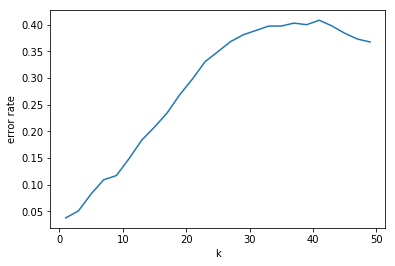

In [33]:
trainKnn(*fitPca(*getData()))

# Model 3: LDA-kNN

In [34]:
def fitLda(trainingData, testingData, trainingLabels, testingLabels):
    print(f'trainingData: {trainingData.shape}, trainingLabels: {trainingLabels.shape}')
    print(f'testingData: {testingData.shape}, testingLabels: {testingLabels.shape}')

    scaler = StandardScaler()
    trainingData = scaler.fit_transform(trainingData)
    testingData = scaler.fit_transform(testingData)

    lda = LDA(n_components=3)
    lda.fit(trainingData, trainingLabels)

    scatter3d(trainingData[:, 0], trainingData[:, 1],trainingData[:, 2], trainingLabels)

    trainingData = lda.transform(trainingData)
    testingData = lda.transform(testingData)

    scatter3d(trainingData[:, 0], trainingData[:, 1],trainingData[:, 2], trainingLabels)
    
    return (trainingData, testingData, trainingLabels, testingLabels)

trainingData: (375, 1024), trainingLabels: (375,)
testingData: (125, 1024), testingLabels: (125,)


C:\Users\GaryNg\Anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")


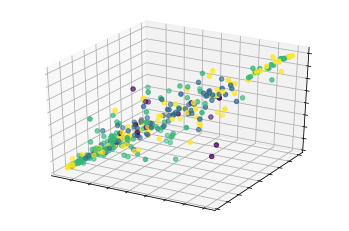

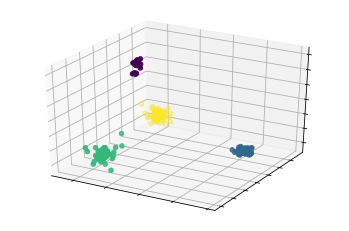

trainingData: (375, 3), trainingLabels: (375,)
testingData: (125, 3), testingLabels: (125,)
optimal k: 1
training accuracy: 1.0
testing accuracy: 0.96
confusion matrix: 
 [[ 7  0  0  1]
 [ 1 21  1  0]
 [ 1  1 65  0]
 [ 0  0  0 27]]
              precision    recall  f1-score   support

           0       0.78      0.88      0.82         8
           1       0.95      0.91      0.93        23
           2       0.98      0.97      0.98        67
           3       0.96      1.00      0.98        27

   micro avg       0.96      0.96      0.96       125
   macro avg       0.92      0.94      0.93       125
weighted avg       0.96      0.96      0.96       125



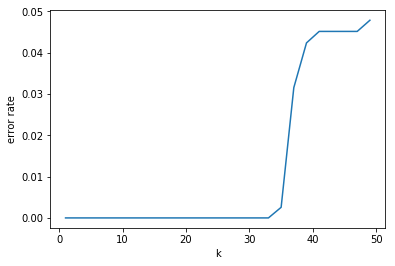

In [35]:
trainKnn(*fitLda(*getData()))

# Model 3: PCA-LDA-kNN

trainingData: (375, 1024), trainingLabels: (375,)
testingData: (125, 1024), testingLabels: (125,)
total explained variance: 0.9443089031170777


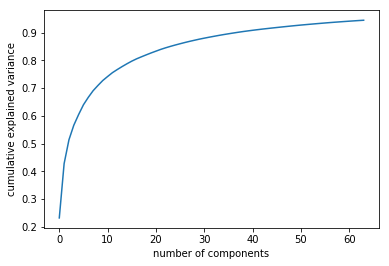

pca components: (64, 1024)


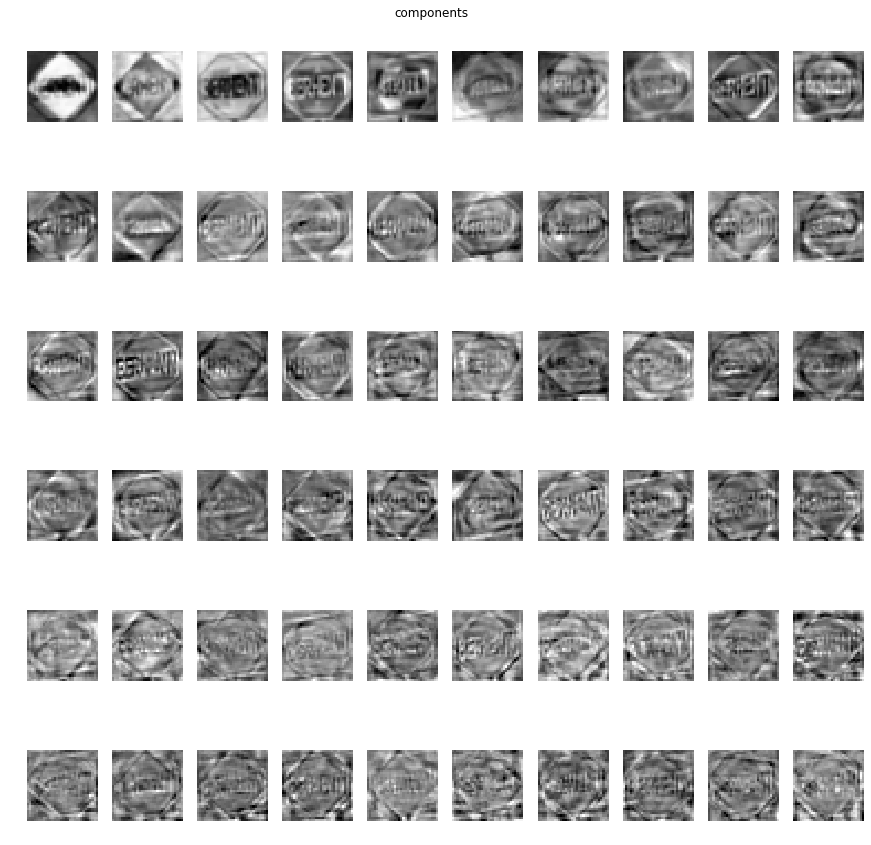

trainingData: (375, 64), trainingLabels: (375,)
testingData: (125, 64), testingLabels: (125,)


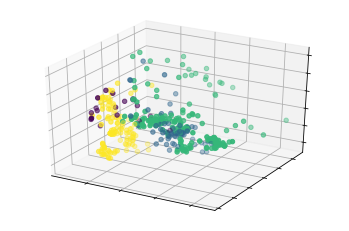

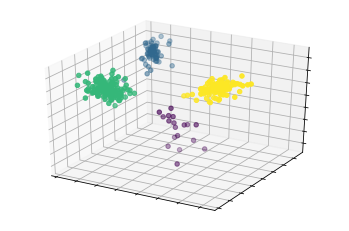

trainingData: (375, 3), trainingLabels: (375,)
testingData: (125, 3), testingLabels: (125,)
optimal k: 1
training accuracy: 1.0
testing accuracy: 0.992
confusion matrix: 
 [[ 7  0  0  1]
 [ 0 23  0  0]
 [ 0  0 67  0]
 [ 0  0  0 27]]
              precision    recall  f1-score   support

           0       1.00      0.88      0.93         8
           1       1.00      1.00      1.00        23
           2       1.00      1.00      1.00        67
           3       0.96      1.00      0.98        27

   micro avg       0.99      0.99      0.99       125
   macro avg       0.99      0.97      0.98       125
weighted avg       0.99      0.99      0.99       125



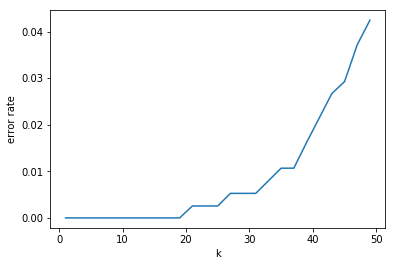

In [36]:
trainKnn(*fitLda(*fitPca(*getData())))

# Model 4: PCA-SVM

In [37]:
def trainSvm(trainingData, testingData, trainingLabels, testingLabels):
    print(f'trainingData: {trainingData.shape}, trainingLabels: {trainingLabels.shape}')
    print(f'testingData: {testingData.shape}, testingLabels: {testingLabels.shape}')

    svm = SVM.SVC(gamma='auto', kernel='linear', random_state=0)
    svm.fit(trainingData, trainingLabels)
    
    print(f'training accuracy: {svm.score(trainingData, trainingLabels)}')
    print(f'testing accuracy: {svm.score(testingData, testingLabels)}')

    predictedLabels = svm.predict(testingData)
    print(f'confusion matrix: \n {confusion_matrix(testingLabels, predictedLabels)}')
    print(classification_report(testingLabels, predictedLabels))

trainingData: (375, 1024), trainingLabels: (375,)
testingData: (125, 1024), testingLabels: (125,)
total explained variance: 0.9443228014007938


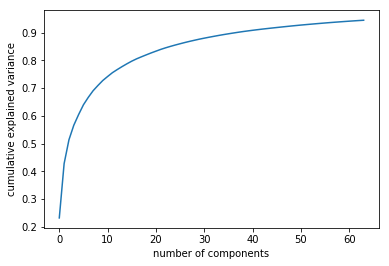

pca components: (64, 1024)


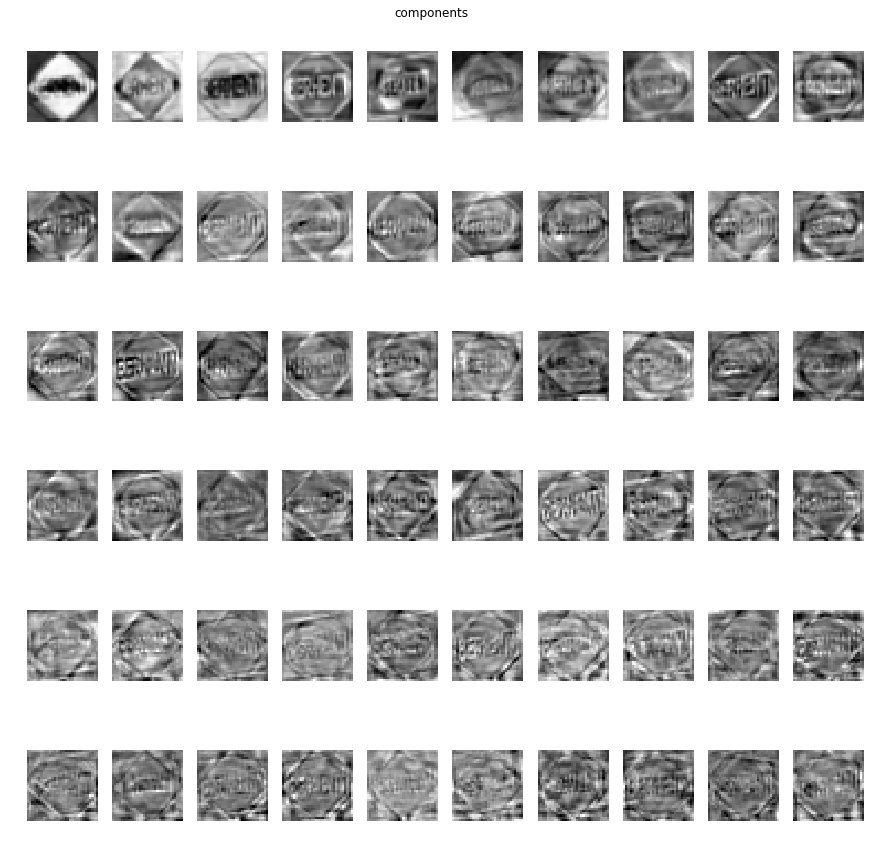

trainingData: (375, 64), trainingLabels: (375,)
testingData: (125, 64), testingLabels: (125,)
training accuracy: 1.0
testing accuracy: 0.992
confusion matrix: 
 [[ 7  0  0  1]
 [ 0 23  0  0]
 [ 0  0 67  0]
 [ 0  0  0 27]]
              precision    recall  f1-score   support

           0       1.00      0.88      0.93         8
           1       1.00      1.00      1.00        23
           2       1.00      1.00      1.00        67
           3       0.96      1.00      0.98        27

   micro avg       0.99      0.99      0.99       125
   macro avg       0.99      0.97      0.98       125
weighted avg       0.99      0.99      0.99       125



In [38]:
trainSvm(*fitPca(*getData()))

# Model 6: PCA-LDA-SVM

trainingData: (375, 1024), trainingLabels: (375,)
testingData: (125, 1024), testingLabels: (125,)
total explained variance: 0.9443203098661364


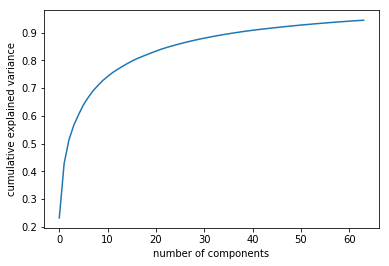

pca components: (64, 1024)


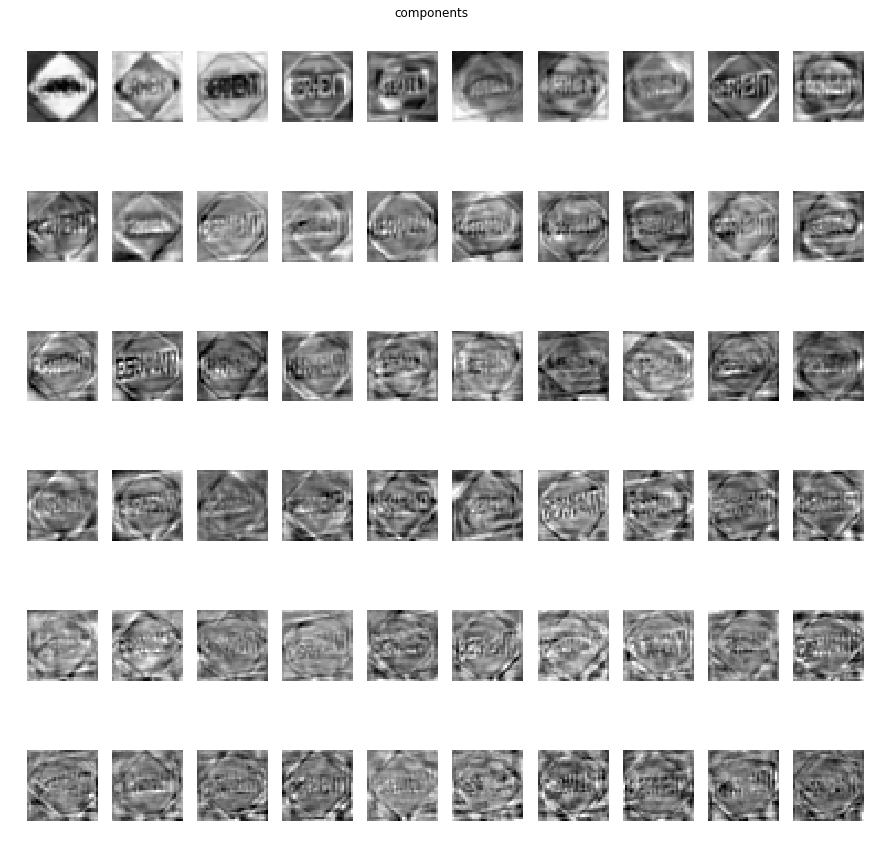

trainingData: (375, 64), trainingLabels: (375,)
testingData: (125, 64), testingLabels: (125,)


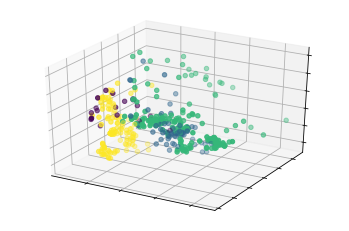

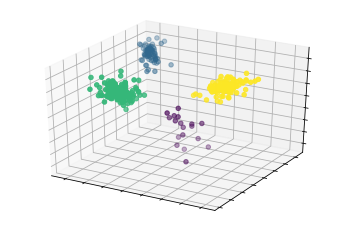

trainingData: (375, 3), trainingLabels: (375,)
testingData: (125, 3), testingLabels: (125,)
training accuracy: 1.0
testing accuracy: 0.992
confusion matrix: 
 [[ 7  0  0  1]
 [ 0 23  0  0]
 [ 0  0 67  0]
 [ 0  0  0 27]]
              precision    recall  f1-score   support

           0       1.00      0.88      0.93         8
           1       1.00      1.00      1.00        23
           2       1.00      1.00      1.00        67
           3       0.96      1.00      0.98        27

   micro avg       0.99      0.99      0.99       125
   macro avg       0.99      0.97      0.98       125
weighted avg       0.99      0.99      0.99       125



In [39]:
trainSvm(*fitLda(*fitPca(*getData())))

# Model 7: MLP

In [40]:
def trainMlp(trainingData, testingData, trainingLabels, testingLabels, layers=(1024, 1024)):
    
    print(f'trainingData: {trainingData.shape}, trainingLabels: {trainingLabels.shape}')
    print(f'testingData: {testingData.shape}, testingLabels: {testingLabels.shape}')

    scaler = StandardScaler()
    trainingData = scaler.fit_transform(trainingData)
    testingData = scaler.fit_transform(testingData)

    mlp = MLPClassifier(random_state=0, verbose=True, hidden_layer_sizes=layers)
    mlp.fit(trainingData, trainingLabels)

    print(mlp)
    print(f'training accuracy: {mlp.score(trainingData, trainingLabels)}')
    print(f'testing accuracy: {mlp.score(testingData, testingLabels)}')

    predictedLabels = mlp.predict(testingData)
    print(f'confusion matrix: \n {confusion_matrix(testingLabels, predictedLabels)}')
    print(classification_report(testingLabels, predictedLabels))

In [41]:
trainMlp(*getData())

trainingData: (375, 1024), trainingLabels: (375,)
testingData: (125, 1024), testingLabels: (125,)
Iteration 1, loss = 0.98445011
Iteration 2, loss = 0.08688085
Iteration 3, loss = 0.06993920
Iteration 4, loss = 0.00259222
Iteration 5, loss = 0.00732444
Iteration 6, loss = 0.00837116
Iteration 7, loss = 0.00230393
Iteration 8, loss = 0.00108071
Iteration 9, loss = 0.00069248
Iteration 10, loss = 0.00068976
Iteration 11, loss = 0.00069921
Iteration 12, loss = 0.00068605
Iteration 13, loss = 0.00070754
Iteration 14, loss = 0.00071357
Iteration 15, loss = 0.00070887
Iteration 16, loss = 0.00067750
Iteration 17, loss = 0.00064647
Iteration 18, loss = 0.00062245
Iteration 19, loss = 0.00060275
Iteration 20, loss = 0.00059064
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
       beta_2=0.999, early_stopping=False, epsilon=1e-08,
       hidden_layer_sizes=(1024, 1024), learn

# Model 8: PCA-MLP

trainingData: (375, 1024), trainingLabels: (375,)
testingData: (125, 1024), testingLabels: (125,)
total explained variance: 0.9443533218455223


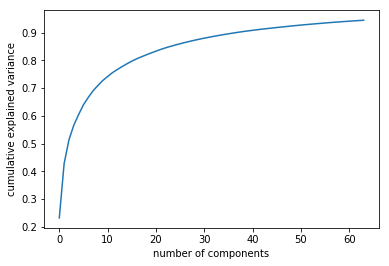

pca components: (64, 1024)


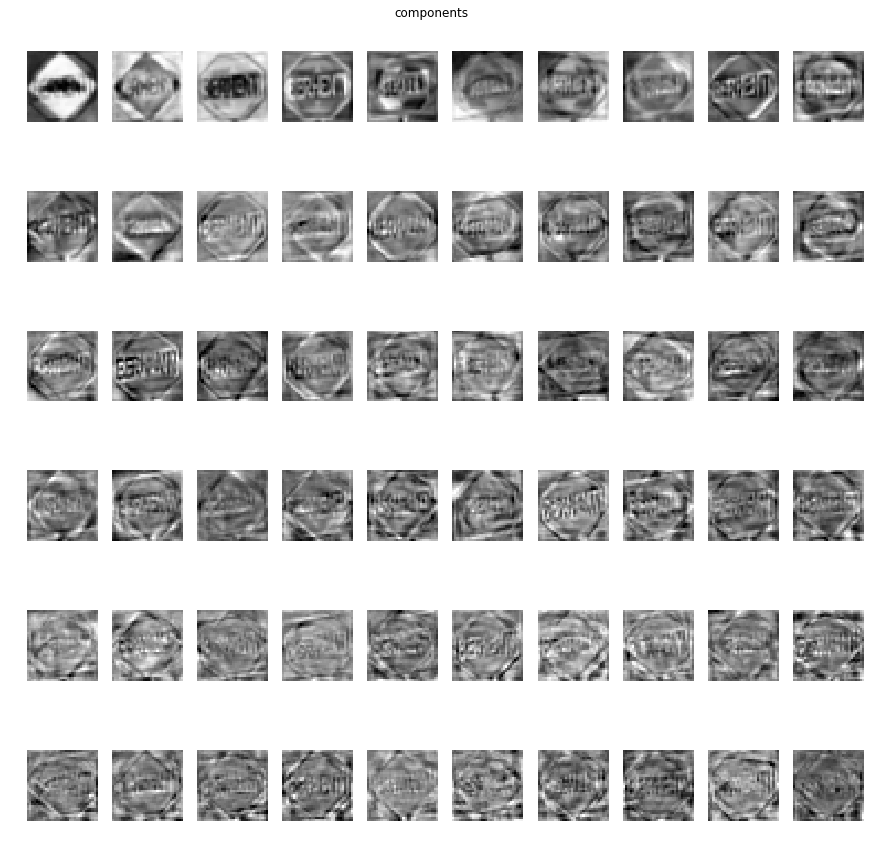

trainingData: (375, 64), trainingLabels: (375,)
testingData: (125, 64), testingLabels: (125,)
Iteration 1, loss = 1.61309297
Iteration 2, loss = 1.49522447
Iteration 3, loss = 1.39456534
Iteration 4, loss = 1.30605626
Iteration 5, loss = 1.23478735
Iteration 6, loss = 1.16834564
Iteration 7, loss = 1.11125695
Iteration 8, loss = 1.06012242
Iteration 9, loss = 1.01319540
Iteration 10, loss = 0.96900562
Iteration 11, loss = 0.92744500
Iteration 12, loss = 0.88579616
Iteration 13, loss = 0.84561256
Iteration 14, loss = 0.80534216
Iteration 15, loss = 0.76612544
Iteration 16, loss = 0.72674336
Iteration 17, loss = 0.68932938
Iteration 18, loss = 0.64962758
Iteration 19, loss = 0.61179703
Iteration 20, loss = 0.57423252
Iteration 21, loss = 0.53786412
Iteration 22, loss = 0.50174423
Iteration 23, loss = 0.46710909
Iteration 24, loss = 0.43282183
Iteration 25, loss = 0.40073867
Iteration 26, loss = 0.36958091
Iteration 27, loss = 0.33980666
Iteration 28, loss = 0.31196384
Iteration 29, loss 

In [42]:
trainMlp(*fitPca(*getData()), layers=(64, 64))

# Model 9: LDA-MLP

trainingData: (375, 1024), trainingLabels: (375,)
testingData: (125, 1024), testingLabels: (125,)


C:\Users\GaryNg\Anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")


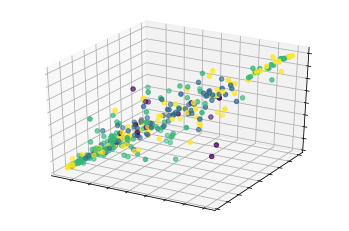

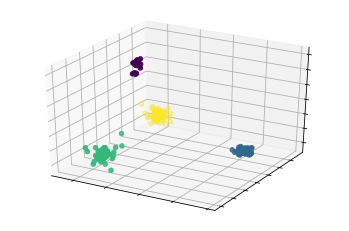

trainingData: (375, 3), trainingLabels: (375,)
testingData: (125, 3), testingLabels: (125,)
Iteration 1, loss = 1.24642156
Iteration 2, loss = 1.20766327
Iteration 3, loss = 1.16916265
Iteration 4, loss = 1.13157888
Iteration 5, loss = 1.09481276
Iteration 6, loss = 1.05887311
Iteration 7, loss = 1.02351347
Iteration 8, loss = 0.98894744
Iteration 9, loss = 0.95526744
Iteration 10, loss = 0.92229549
Iteration 11, loss = 0.89014602
Iteration 12, loss = 0.85843406
Iteration 13, loss = 0.82774935
Iteration 14, loss = 0.79756763
Iteration 15, loss = 0.76816404
Iteration 16, loss = 0.73945753
Iteration 17, loss = 0.71123262
Iteration 18, loss = 0.68390903
Iteration 19, loss = 0.65738788
Iteration 20, loss = 0.63139907
Iteration 21, loss = 0.60608811
Iteration 22, loss = 0.58139568
Iteration 23, loss = 0.55773859
Iteration 24, loss = 0.53451055
Iteration 25, loss = 0.51227390
Iteration 26, loss = 0.49063805
Iteration 27, loss = 0.46971541
Iteration 28, loss = 0.44959529
Iteration 29, loss = 

In [43]:
trainMlp(*fitLda(*getData()), layers=(100, ))

# Model 10: PCA-LDA-MLP

trainingData: (375, 1024), trainingLabels: (375,)
testingData: (125, 1024), testingLabels: (125,)
total explained variance: 0.9443220201975157


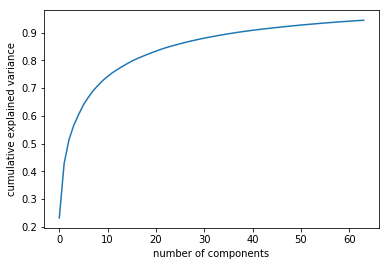

pca components: (64, 1024)


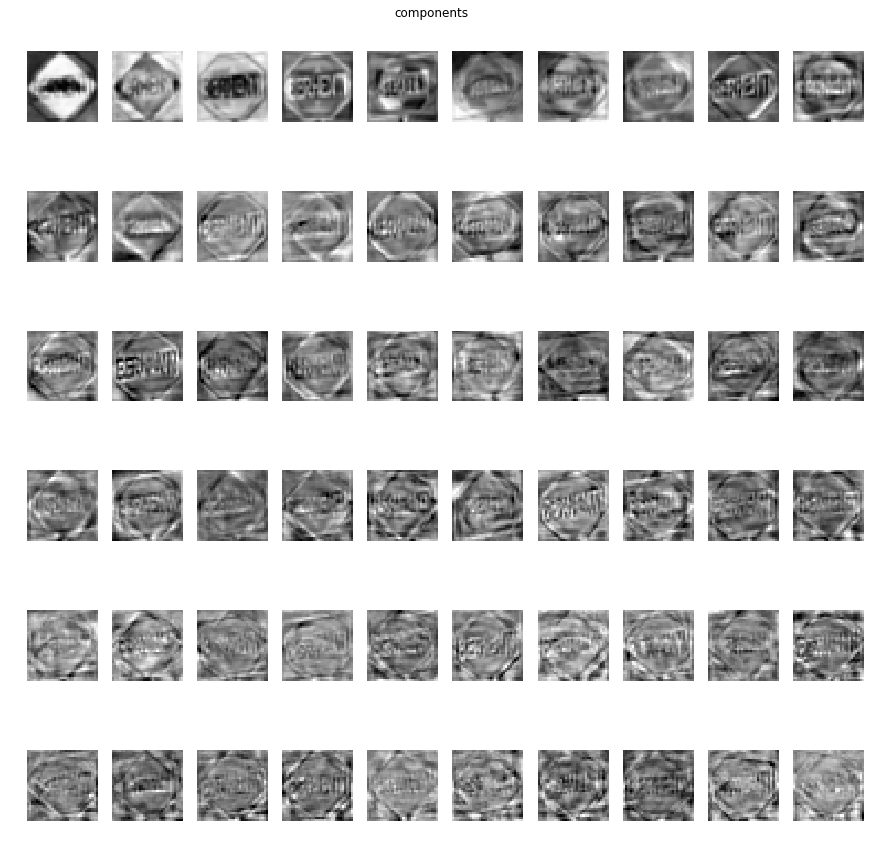

trainingData: (375, 64), trainingLabels: (375,)
testingData: (125, 64), testingLabels: (125,)


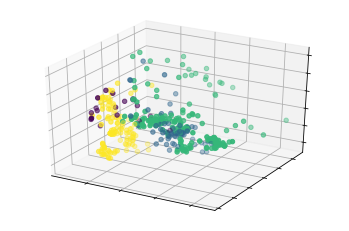

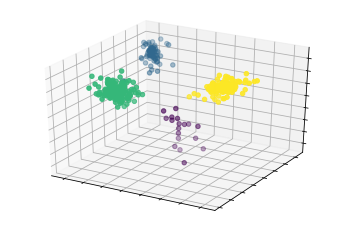

trainingData: (375, 3), trainingLabels: (375,)
testingData: (125, 3), testingLabels: (125,)
Iteration 1, loss = 1.20979992
Iteration 2, loss = 0.58948199
Iteration 3, loss = 0.26138793
Iteration 4, loss = 0.10523986
Iteration 5, loss = 0.04075081
Iteration 6, loss = 0.01760821
Iteration 7, loss = 0.00872802
Iteration 8, loss = 0.00467426
Iteration 9, loss = 0.00296332
Iteration 10, loss = 0.00196047
Iteration 11, loss = 0.00152160
Iteration 12, loss = 0.00116707
Iteration 13, loss = 0.00098555
Iteration 14, loss = 0.00084280
Iteration 15, loss = 0.00075269
Iteration 16, loss = 0.00069382
Iteration 17, loss = 0.00064032
Iteration 18, loss = 0.00060589
Iteration 19, loss = 0.00057353
Iteration 20, loss = 0.00055340
Iteration 21, loss = 0.00053497
Iteration 22, loss = 0.00052072
Iteration 23, loss = 0.00050604
Iteration 24, loss = 0.00049691
Iteration 25, loss = 0.00048769
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
MLPClassifier(activation='r

In [44]:
trainMlp(*fitLda(*fitPca(*getData())))

# Benchmark

In [45]:
def runAll(testSize = 0.25):
    data = train_test_split(*unpickleData(), random_state=123, test_size=testSize)
    print("--- Model 1 ---")
    trainKnn(*data)
    print("--- Model 2 ---")
    trainKnn(*fitPca(*data))
    print("--- Model 3 ---")
    trainKnn(*fitLda(*data))
    print("--- Model 4 ---")
    trainKnn(*fitLda(*fitPca(*data)))
    print("--- Model 5 ---")
    trainSvm(*fitPca(*data))
    print("--- Model 6 ---")
    trainSvm(*fitLda(*fitPca(*data)))
    print("--- Model 7 ---")
    trainMlp(*data)
    print("--- Model 8 ---")
    trainMlp(*fitPca(*data), layers=(64, 64))
    print("--- Model 9 ---")
    trainMlp(*fitLda(*data), layers=(100, ))
    print("--- Model 10 ---")
    trainMlp(*fitLda(*fitPca(*data)))

--- Model 1 ---
trainingData: (300, 1024), trainingLabels: (300,)
testingData: (200, 1024), testingLabels: (200,)
optimal k: 1
training accuracy: 1.0
testing accuracy: 0.99
confusion matrix: 
 [[ 10   0   0   1]
 [  1  30   0   0]
 [  0   0 101   0]
 [  0   0   0  57]]
              precision    recall  f1-score   support

           0       0.91      0.91      0.91        11
           1       1.00      0.97      0.98        31
           2       1.00      1.00      1.00       101
           3       0.98      1.00      0.99        57

   micro avg       0.99      0.99      0.99       200
   macro avg       0.97      0.97      0.97       200
weighted avg       0.99      0.99      0.99       200

--- Model 2 ---
trainingData: (300, 1024), trainingLabels: (300,)
testingData: (200, 1024), testingLabels: (200,)
total explained variance: 0.9493939935834859


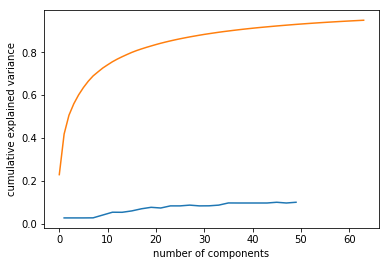

pca components: (64, 1024)


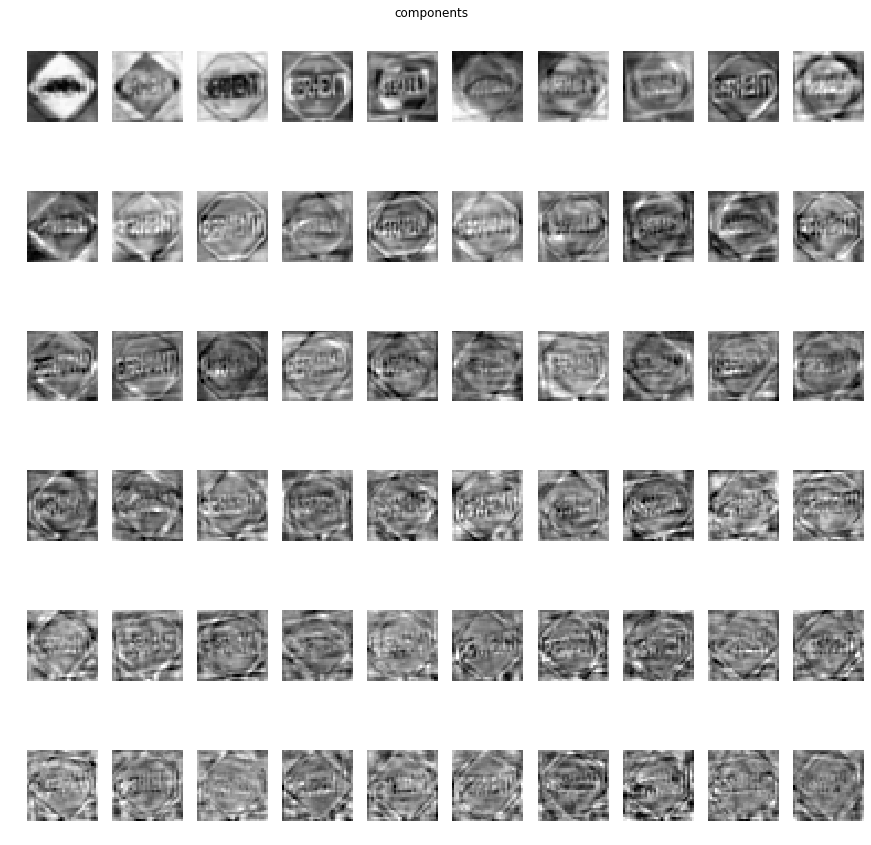

trainingData: (300, 64), trainingLabels: (300,)
testingData: (200, 64), testingLabels: (200,)
optimal k: 1
training accuracy: 1.0
testing accuracy: 0.975
confusion matrix: 
 [[ 10   0   0   1]
 [  0  29   2   0]
 [  0   0 100   1]
 [  0   0   1  56]]
              precision    recall  f1-score   support

           0       1.00      0.91      0.95        11
           1       1.00      0.94      0.97        31
           2       0.97      0.99      0.98       101
           3       0.97      0.98      0.97        57

   micro avg       0.97      0.97      0.97       200
   macro avg       0.98      0.95      0.97       200
weighted avg       0.98      0.97      0.97       200

--- Model 3 ---
trainingData: (300, 1024), trainingLabels: (300,)
testingData: (200, 1024), testingLabels: (200,)


C:\Users\GaryNg\Anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
C:\Users\GaryNg\Anaconda3\lib\site-packages\matplotlib\figure.py:98: MatplotlibDeprecationWarning: 
Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  "Adding an axes using the same arguments as a previous axes "


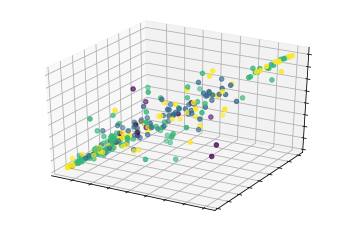

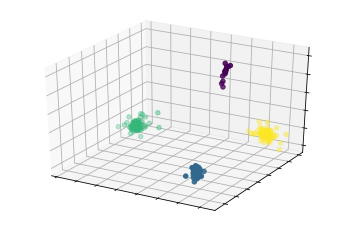

trainingData: (300, 3), trainingLabels: (300,)
testingData: (200, 3), testingLabels: (200,)
optimal k: 1
training accuracy: 1.0
testing accuracy: 0.97
confusion matrix: 
 [[10  0  1  0]
 [ 0 31  0  0]
 [ 0  1 98  2]
 [ 1  0  1 55]]
              precision    recall  f1-score   support

           0       0.91      0.91      0.91        11
           1       0.97      1.00      0.98        31
           2       0.98      0.97      0.98       101
           3       0.96      0.96      0.96        57

   micro avg       0.97      0.97      0.97       200
   macro avg       0.96      0.96      0.96       200
weighted avg       0.97      0.97      0.97       200

--- Model 4 ---
trainingData: (300, 1024), trainingLabels: (300,)
testingData: (200, 1024), testingLabels: (200,)
total explained variance: 0.9494124846073411


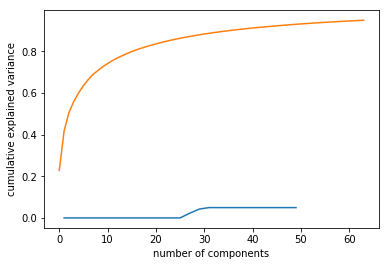

pca components: (64, 1024)


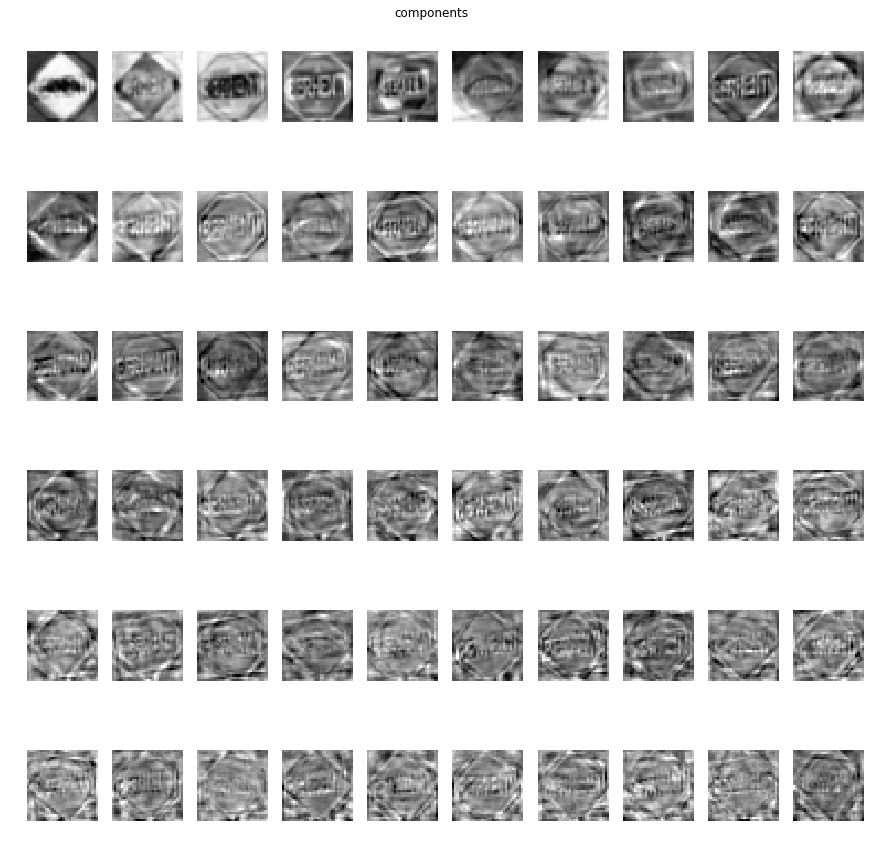

trainingData: (300, 64), trainingLabels: (300,)
testingData: (200, 64), testingLabels: (200,)


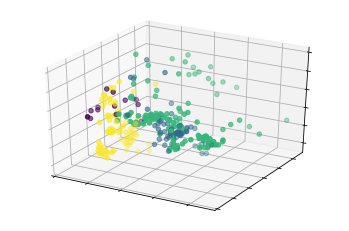

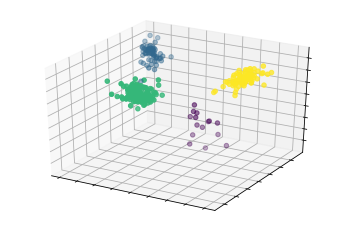

trainingData: (300, 3), trainingLabels: (300,)
testingData: (200, 3), testingLabels: (200,)
optimal k: 1
training accuracy: 1.0
testing accuracy: 0.985
confusion matrix: 
 [[10  0  0  1]
 [ 0 31  0  0]
 [ 0  2 99  0]
 [ 0  0  0 57]]
              precision    recall  f1-score   support

           0       1.00      0.91      0.95        11
           1       0.94      1.00      0.97        31
           2       1.00      0.98      0.99       101
           3       0.98      1.00      0.99        57

   micro avg       0.98      0.98      0.98       200
   macro avg       0.98      0.97      0.98       200
weighted avg       0.99      0.98      0.99       200

--- Model 5 ---
trainingData: (300, 1024), trainingLabels: (300,)
testingData: (200, 1024), testingLabels: (200,)
total explained variance: 0.9494429553419992


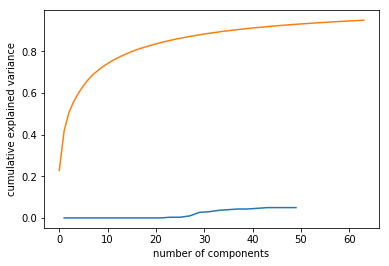

pca components: (64, 1024)


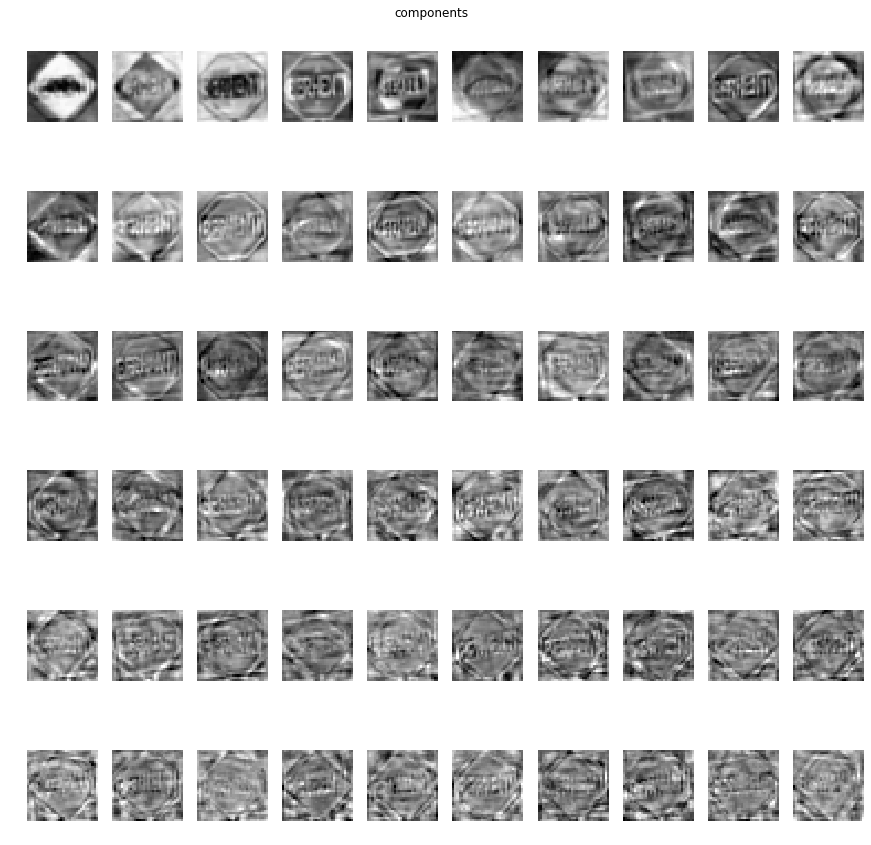

trainingData: (300, 64), trainingLabels: (300,)
testingData: (200, 64), testingLabels: (200,)
training accuracy: 1.0
testing accuracy: 0.99
confusion matrix: 
 [[ 10   0   0   1]
 [  0  31   0   0]
 [  0   1 100   0]
 [  0   0   0  57]]
              precision    recall  f1-score   support

           0       1.00      0.91      0.95        11
           1       0.97      1.00      0.98        31
           2       1.00      0.99      1.00       101
           3       0.98      1.00      0.99        57

   micro avg       0.99      0.99      0.99       200
   macro avg       0.99      0.97      0.98       200
weighted avg       0.99      0.99      0.99       200

--- Model 6 ---
trainingData: (300, 1024), trainingLabels: (300,)
testingData: (200, 1024), testingLabels: (200,)
total explained variance: 0.9494058238317254


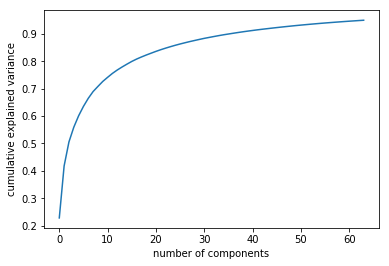

pca components: (64, 1024)


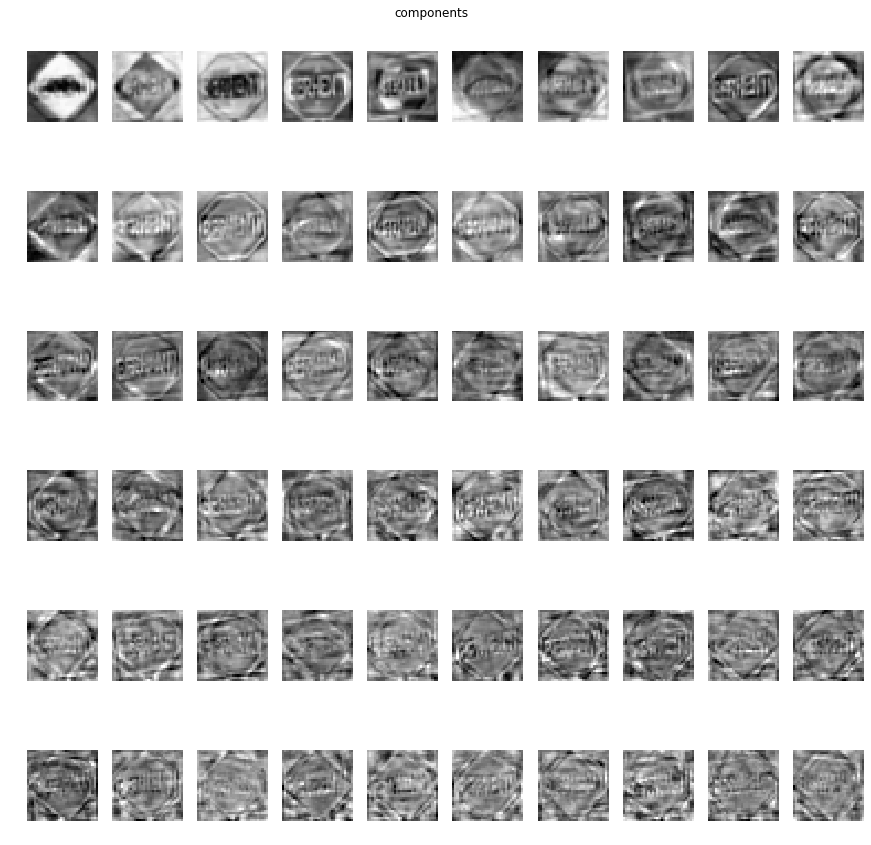

trainingData: (300, 64), trainingLabels: (300,)
testingData: (200, 64), testingLabels: (200,)


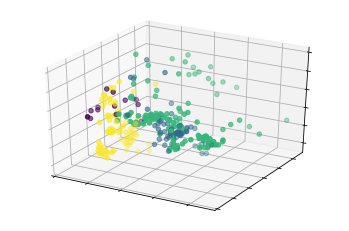

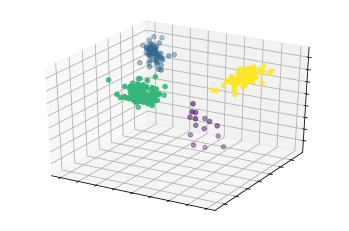

trainingData: (300, 3), trainingLabels: (300,)
testingData: (200, 3), testingLabels: (200,)
training accuracy: 1.0
testing accuracy: 0.985
confusion matrix: 
 [[10  0  0  1]
 [ 0 31  0  0]
 [ 0  2 99  0]
 [ 0  0  0 57]]
              precision    recall  f1-score   support

           0       1.00      0.91      0.95        11
           1       0.94      1.00      0.97        31
           2       1.00      0.98      0.99       101
           3       0.98      1.00      0.99        57

   micro avg       0.98      0.98      0.98       200
   macro avg       0.98      0.97      0.98       200
weighted avg       0.99      0.98      0.99       200

--- Model 7 ---
trainingData: (300, 1024), trainingLabels: (300,)
testingData: (200, 1024), testingLabels: (200,)
Iteration 1, loss = 1.13716667
Iteration 2, loss = 0.10960731
Iteration 3, loss = 0.05273263
Iteration 4, loss = 0.00718787
Iteration 5, loss = 0.01229409
Iteration 6, loss = 0.01133413
Iteration 7, loss = 0.00202285
Iteration 8, l

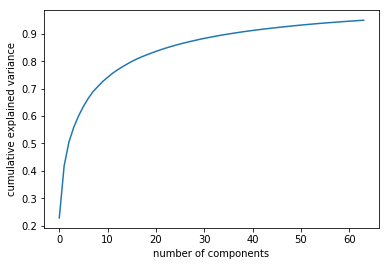

pca components: (64, 1024)


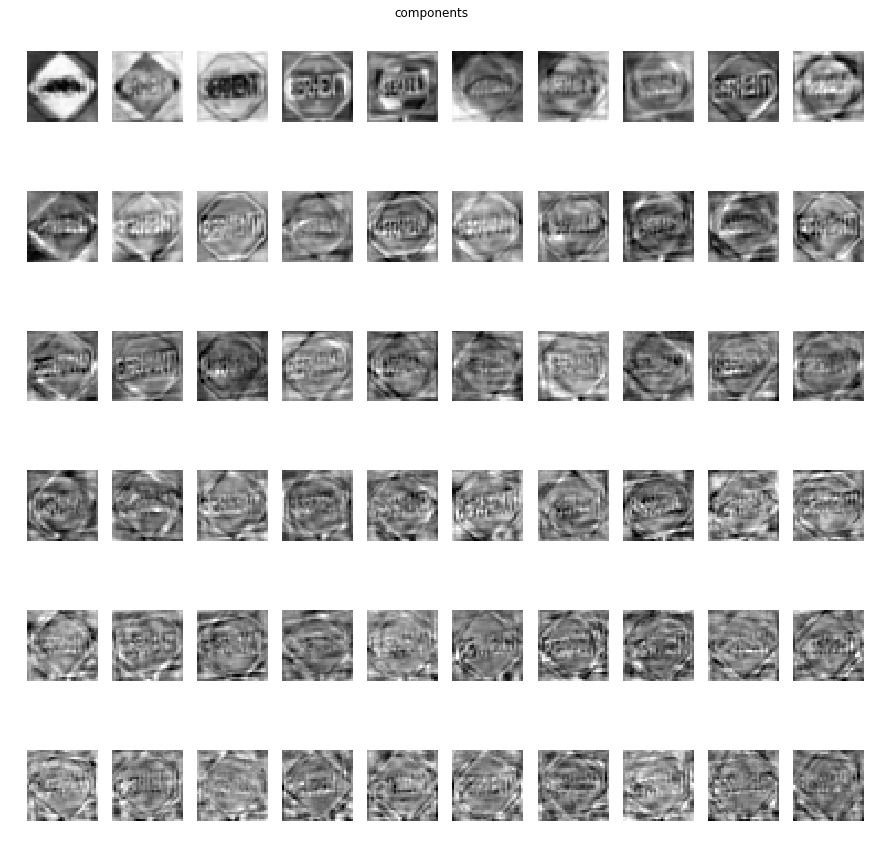

trainingData: (300, 64), trainingLabels: (300,)
testingData: (200, 64), testingLabels: (200,)
Iteration 1, loss = 1.60566376
Iteration 2, loss = 1.49075472
Iteration 3, loss = 1.39373341
Iteration 4, loss = 1.30935800
Iteration 5, loss = 1.23531317
Iteration 6, loss = 1.17347504
Iteration 7, loss = 1.11692695
Iteration 8, loss = 1.06494100
Iteration 9, loss = 1.01760514
Iteration 10, loss = 0.97106549
Iteration 11, loss = 0.92709832
Iteration 12, loss = 0.88400635
Iteration 13, loss = 0.84198877
Iteration 14, loss = 0.80011143
Iteration 15, loss = 0.75905628
Iteration 16, loss = 0.71872644
Iteration 17, loss = 0.67853195
Iteration 18, loss = 0.63979273
Iteration 19, loss = 0.60123722
Iteration 20, loss = 0.56335036
Iteration 21, loss = 0.52709525
Iteration 22, loss = 0.49075217
Iteration 23, loss = 0.45647921
Iteration 24, loss = 0.42270203
Iteration 25, loss = 0.39068038
Iteration 26, loss = 0.36008183
Iteration 27, loss = 0.33097560
Iteration 28, loss = 0.30369758
Iteration 29, loss 

C:\Users\GaryNg\Anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")


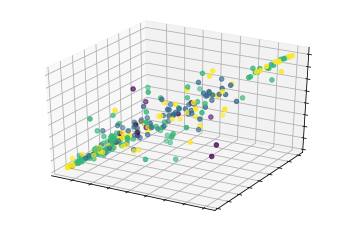

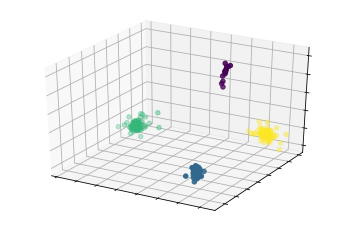

trainingData: (300, 3), trainingLabels: (300,)
testingData: (200, 3), testingLabels: (200,)
Iteration 1, loss = 1.39807546
Iteration 2, loss = 1.35457928
Iteration 3, loss = 1.31210484
Iteration 4, loss = 1.27113602
Iteration 5, loss = 1.23073532
Iteration 6, loss = 1.19153544
Iteration 7, loss = 1.15270211
Iteration 8, loss = 1.11557849
Iteration 9, loss = 1.07905612
Iteration 10, loss = 1.04329962
Iteration 11, loss = 1.00837235
Iteration 12, loss = 0.97417124
Iteration 13, loss = 0.94080806
Iteration 14, loss = 0.90847124
Iteration 15, loss = 0.87648789
Iteration 16, loss = 0.84547598
Iteration 17, loss = 0.81520169
Iteration 18, loss = 0.78558578
Iteration 19, loss = 0.75659836
Iteration 20, loss = 0.72828706
Iteration 21, loss = 0.70063733
Iteration 22, loss = 0.67394733
Iteration 23, loss = 0.64755523
Iteration 24, loss = 0.62217512
Iteration 25, loss = 0.59736733
Iteration 26, loss = 0.57331306
Iteration 27, loss = 0.55010978
Iteration 28, loss = 0.52746101
Iteration 29, loss = 

C:\Users\GaryNg\Anaconda3\lib\site-packages\sklearn\neural_network\multilayer_perceptron.py:562: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
       beta_2=0.999, early_stopping=False, epsilon=1e-08,
       hidden_layer_sizes=(100,), learning_rate='constant',
       learning_rate_init=0.001, max_iter=200, momentum=0.9,
       n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
       random_state=0, shuffle=True, solver='adam', tol=0.0001,
       validation_fraction=0.1, verbose=True, warm_start=False)
training accuracy: 1.0
testing accuracy: 0.965
confusion matrix: 
 [[10  0  1  0]
 [ 0 31  0  0]
 [ 0  2 97  2]
 [ 1  0  1 55]]
              precision    recall  f1-score   support

           0       0.91      0.91      0.91        11
           1       0.94      1.00      0.97        31
           2       0.98      0.96      0.97       101
           3       0.96      0.96      0.96        57

   micro avg       0.96      0.96      0.96       200
   macro avg       0.95      0.96      0.95       200
weighted avg       0.97      0.96      0.

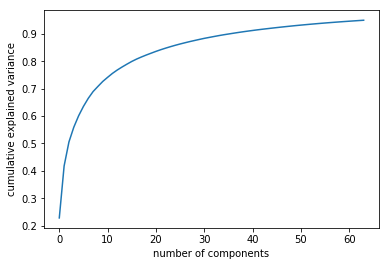

pca components: (64, 1024)


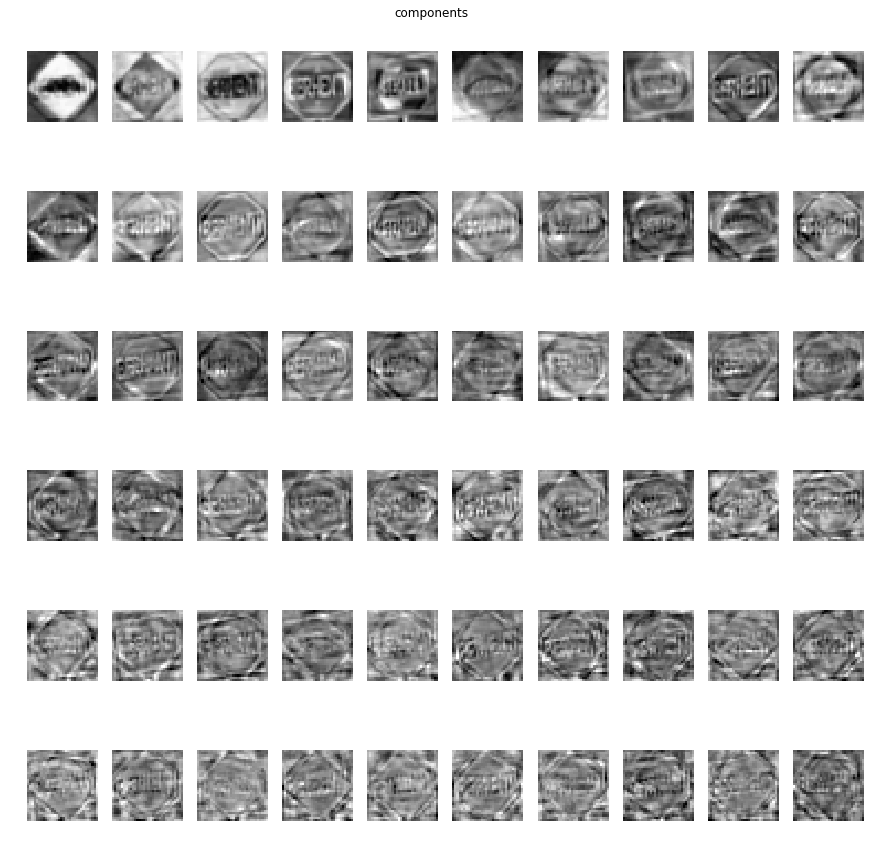

trainingData: (300, 64), trainingLabels: (300,)
testingData: (200, 64), testingLabels: (200,)


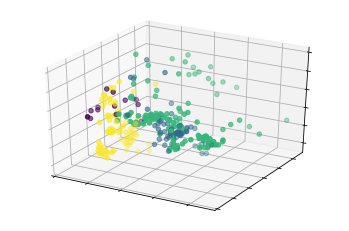

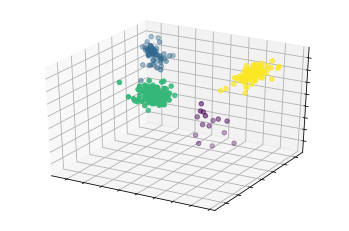

trainingData: (300, 3), trainingLabels: (300,)
testingData: (200, 3), testingLabels: (200,)
Iteration 1, loss = 1.26551276
Iteration 2, loss = 0.62153602
Iteration 3, loss = 0.27647742
Iteration 4, loss = 0.11072530
Iteration 5, loss = 0.04335855
Iteration 6, loss = 0.01800272
Iteration 7, loss = 0.00826062
Iteration 8, loss = 0.00449910
Iteration 9, loss = 0.00267129
Iteration 10, loss = 0.00181871
Iteration 11, loss = 0.00129914
Iteration 12, loss = 0.00103217
Iteration 13, loss = 0.00086534
Iteration 14, loss = 0.00075975
Iteration 15, loss = 0.00068434
Iteration 16, loss = 0.00063493
Iteration 17, loss = 0.00059857
Iteration 18, loss = 0.00056931
Iteration 19, loss = 0.00054769
Iteration 20, loss = 0.00053149
Iteration 21, loss = 0.00051658
Iteration 22, loss = 0.00050645
Iteration 23, loss = 0.00049611
Iteration 24, loss = 0.00048956
Iteration 25, loss = 0.00048290
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
MLPClassifier(activation='r

In [46]:
runAll(testSize=0.4)

--- Model 1 ---
trainingData: (250, 1024), trainingLabels: (250,)
testingData: (250, 1024), testingLabels: (250,)
optimal k: 5
training accuracy: 0.98
testing accuracy: 0.98
confusion matrix: 
 [[ 13   0   0   1]
 [  2  39   0   1]
 [  0   0 117   1]
 [  0   0   0  76]]
              precision    recall  f1-score   support

           0       0.87      0.93      0.90        14
           1       1.00      0.93      0.96        42
           2       1.00      0.99      1.00       118
           3       0.96      1.00      0.98        76

   micro avg       0.98      0.98      0.98       250
   macro avg       0.96      0.96      0.96       250
weighted avg       0.98      0.98      0.98       250

--- Model 2 ---
trainingData: (250, 1024), trainingLabels: (250,)
testingData: (250, 1024), testingLabels: (250,)
total explained variance: 0.9535341962901396


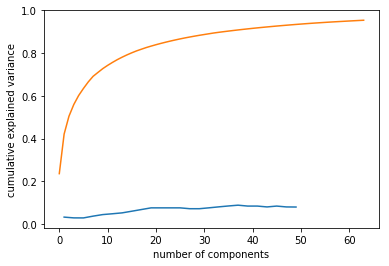

pca components: (64, 1024)


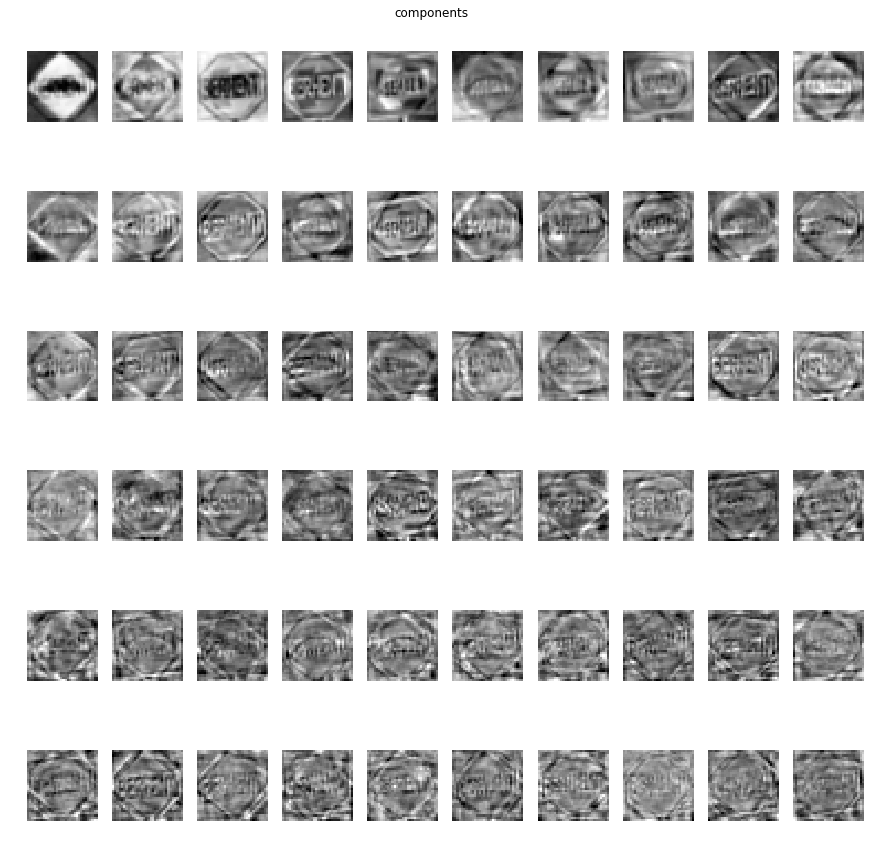

trainingData: (250, 64), trainingLabels: (250,)
testingData: (250, 64), testingLabels: (250,)
optimal k: 1
training accuracy: 1.0
testing accuracy: 0.972
confusion matrix: 
 [[ 12   0   2   0]
 [  0  37   4   1]
 [  0   0 118   0]
 [  0   0   0  76]]
              precision    recall  f1-score   support

           0       1.00      0.86      0.92        14
           1       1.00      0.88      0.94        42
           2       0.95      1.00      0.98       118
           3       0.99      1.00      0.99        76

   micro avg       0.97      0.97      0.97       250
   macro avg       0.98      0.93      0.96       250
weighted avg       0.97      0.97      0.97       250

--- Model 3 ---
trainingData: (250, 1024), trainingLabels: (250,)
testingData: (250, 1024), testingLabels: (250,)


C:\Users\GaryNg\Anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
C:\Users\GaryNg\Anaconda3\lib\site-packages\matplotlib\figure.py:98: MatplotlibDeprecationWarning: 
Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  "Adding an axes using the same arguments as a previous axes "


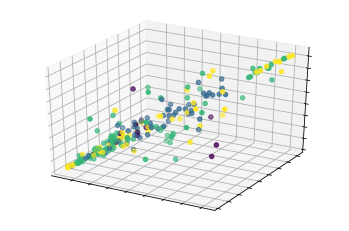

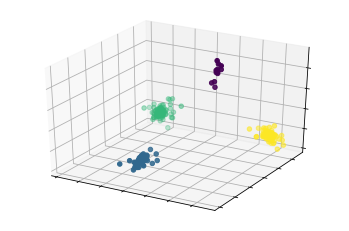

trainingData: (250, 3), trainingLabels: (250,)
testingData: (250, 3), testingLabels: (250,)
optimal k: 1
training accuracy: 1.0
testing accuracy: 0.988
confusion matrix: 
 [[ 13   0   1   0]
 [  1  41   0   0]
 [  0   1 117   0]
 [  0   0   0  76]]
              precision    recall  f1-score   support

           0       0.93      0.93      0.93        14
           1       0.98      0.98      0.98        42
           2       0.99      0.99      0.99       118
           3       1.00      1.00      1.00        76

   micro avg       0.99      0.99      0.99       250
   macro avg       0.97      0.97      0.97       250
weighted avg       0.99      0.99      0.99       250

--- Model 4 ---
trainingData: (250, 1024), trainingLabels: (250,)
testingData: (250, 1024), testingLabels: (250,)
total explained variance: 0.9536011681512757


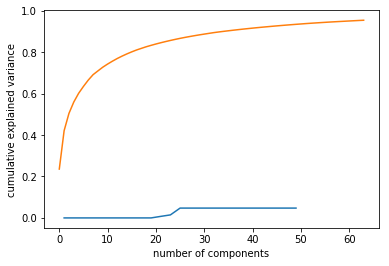

pca components: (64, 1024)


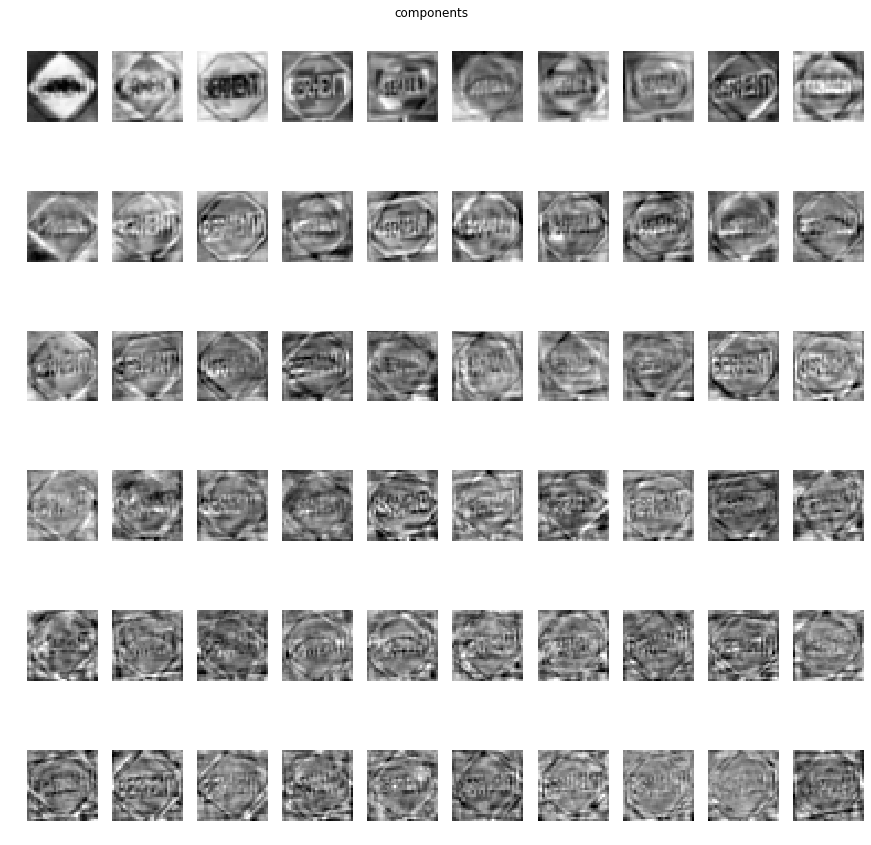

trainingData: (250, 64), trainingLabels: (250,)
testingData: (250, 64), testingLabels: (250,)


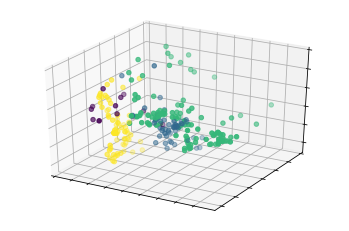

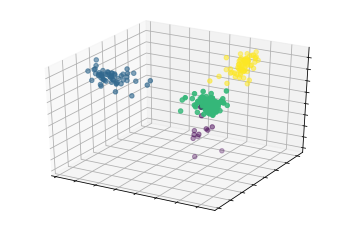

trainingData: (250, 3), trainingLabels: (250,)
testingData: (250, 3), testingLabels: (250,)
optimal k: 1
training accuracy: 1.0
testing accuracy: 0.992
confusion matrix: 
 [[ 13   0   0   1]
 [  0  42   0   0]
 [  0   1 117   0]
 [  0   0   0  76]]
              precision    recall  f1-score   support

           0       1.00      0.93      0.96        14
           1       0.98      1.00      0.99        42
           2       1.00      0.99      1.00       118
           3       0.99      1.00      0.99        76

   micro avg       0.99      0.99      0.99       250
   macro avg       0.99      0.98      0.99       250
weighted avg       0.99      0.99      0.99       250

--- Model 5 ---
trainingData: (250, 1024), trainingLabels: (250,)
testingData: (250, 1024), testingLabels: (250,)
total explained variance: 0.953504329704072


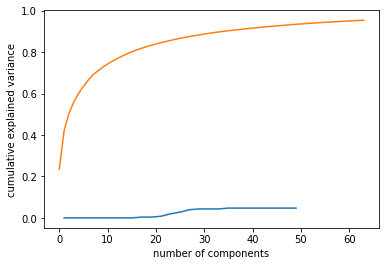

pca components: (64, 1024)


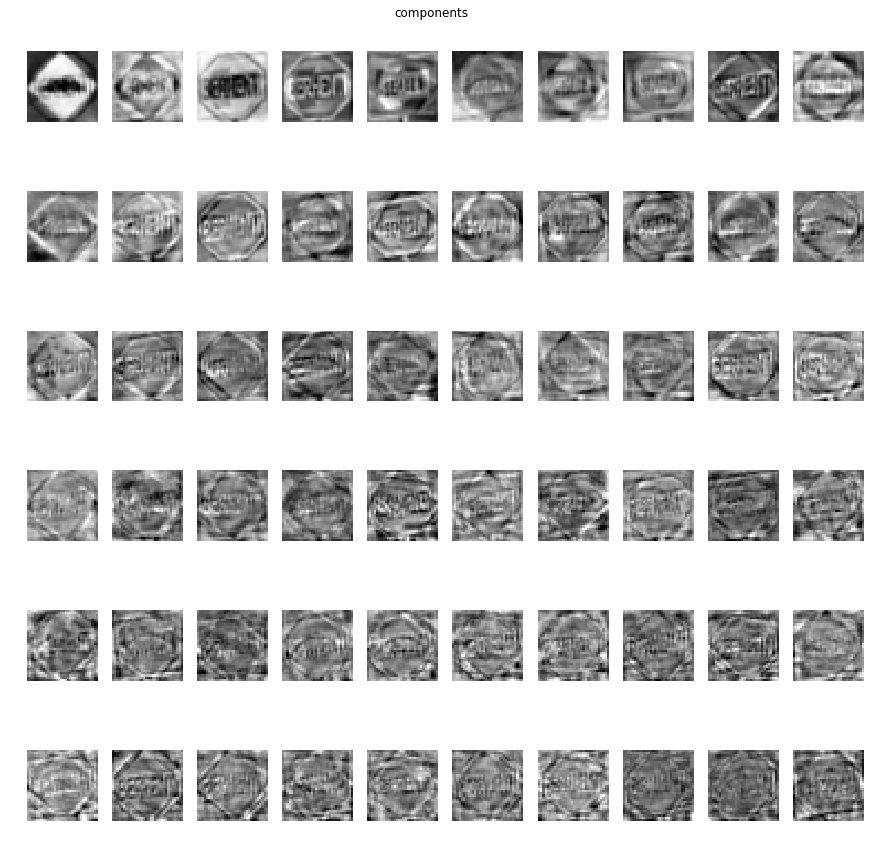

trainingData: (250, 64), trainingLabels: (250,)
testingData: (250, 64), testingLabels: (250,)
training accuracy: 1.0
testing accuracy: 0.988
confusion matrix: 
 [[ 13   0   0   1]
 [  0  41   0   1]
 [  0   1 117   0]
 [  0   0   0  76]]
              precision    recall  f1-score   support

           0       1.00      0.93      0.96        14
           1       0.98      0.98      0.98        42
           2       1.00      0.99      1.00       118
           3       0.97      1.00      0.99        76

   micro avg       0.99      0.99      0.99       250
   macro avg       0.99      0.97      0.98       250
weighted avg       0.99      0.99      0.99       250

--- Model 6 ---
trainingData: (250, 1024), trainingLabels: (250,)
testingData: (250, 1024), testingLabels: (250,)
total explained variance: 0.9535996155525811


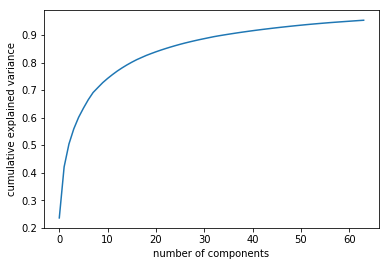

pca components: (64, 1024)


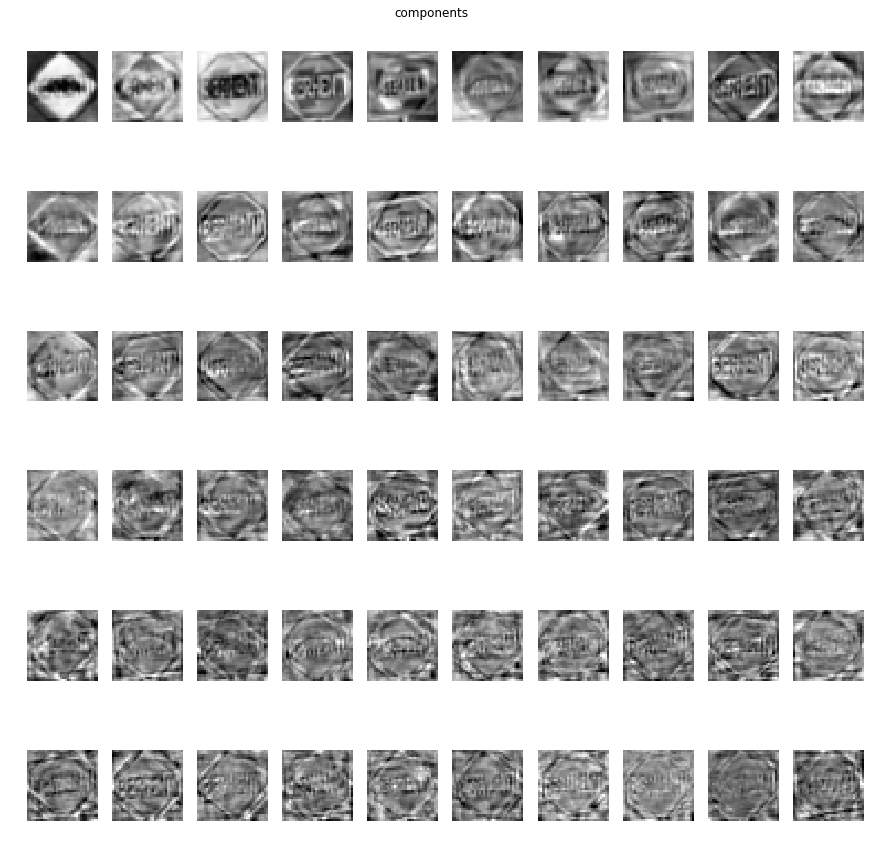

trainingData: (250, 64), trainingLabels: (250,)
testingData: (250, 64), testingLabels: (250,)


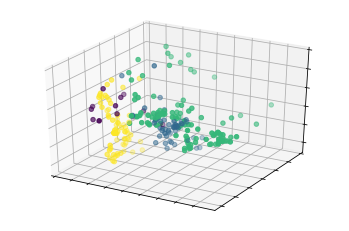

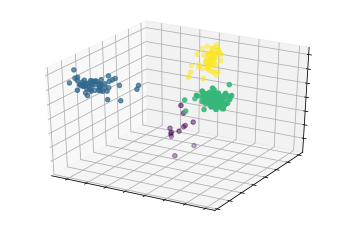

trainingData: (250, 3), trainingLabels: (250,)
testingData: (250, 3), testingLabels: (250,)
training accuracy: 1.0
testing accuracy: 0.996
confusion matrix: 
 [[ 14   0   0   0]
 [  0  42   0   0]
 [  0   1 117   0]
 [  0   0   0  76]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        14
           1       0.98      1.00      0.99        42
           2       1.00      0.99      1.00       118
           3       1.00      1.00      1.00        76

   micro avg       1.00      1.00      1.00       250
   macro avg       0.99      1.00      1.00       250
weighted avg       1.00      1.00      1.00       250

--- Model 7 ---
trainingData: (250, 1024), trainingLabels: (250,)
testingData: (250, 1024), testingLabels: (250,)
Iteration 1, loss = 1.17687057
Iteration 2, loss = 0.05443517
Iteration 3, loss = 0.05426800
Iteration 4, loss = 0.00742041
Iteration 5, loss = 0.09029260
Iteration 6, loss = 0.00448998
Iteration 7, loss = 0.0011962

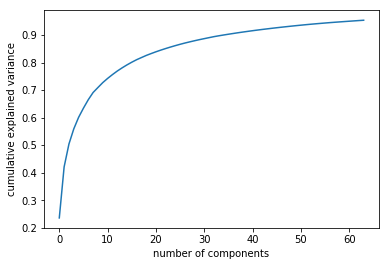

pca components: (64, 1024)


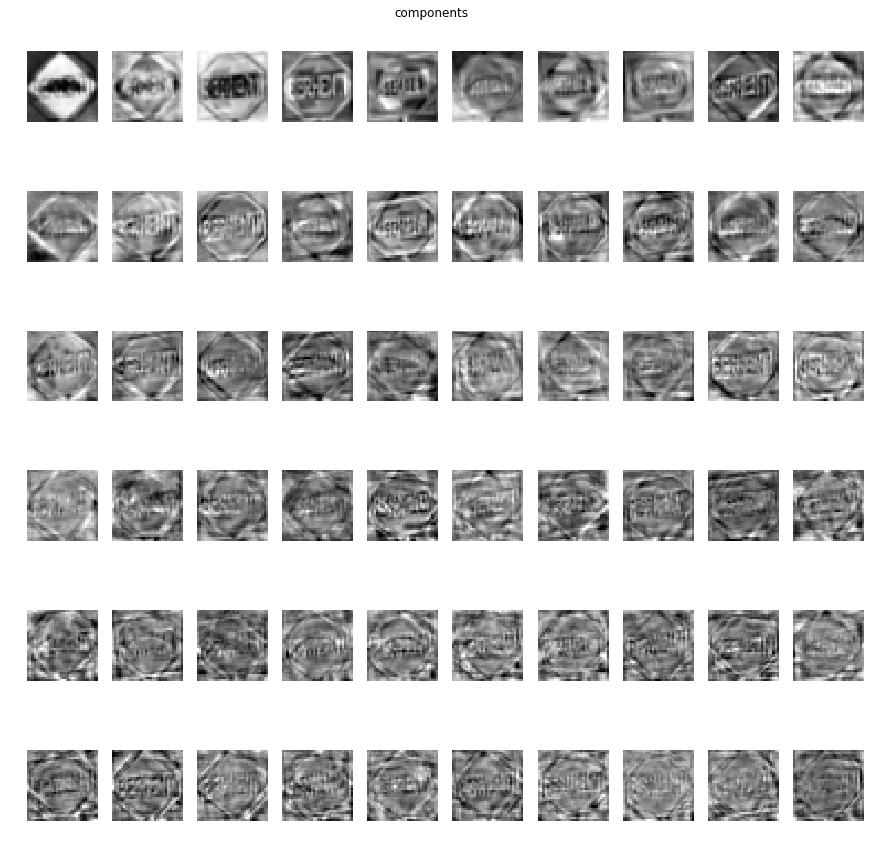

trainingData: (250, 64), trainingLabels: (250,)
testingData: (250, 64), testingLabels: (250,)
Iteration 1, loss = 1.62300166
Iteration 2, loss = 1.50113389
Iteration 3, loss = 1.40830556
Iteration 4, loss = 1.32130305
Iteration 5, loss = 1.25165484
Iteration 6, loss = 1.18897671
Iteration 7, loss = 1.13331788
Iteration 8, loss = 1.08291283
Iteration 9, loss = 1.03669488
Iteration 10, loss = 0.99407782
Iteration 11, loss = 0.95304589
Iteration 12, loss = 0.91271376
Iteration 13, loss = 0.87450859
Iteration 14, loss = 0.83638756
Iteration 15, loss = 0.79972438
Iteration 16, loss = 0.76317359
Iteration 17, loss = 0.72729396
Iteration 18, loss = 0.69212358
Iteration 19, loss = 0.65734496
Iteration 20, loss = 0.62278764
Iteration 21, loss = 0.58884829
Iteration 22, loss = 0.55576067
Iteration 23, loss = 0.52308603
Iteration 24, loss = 0.49062221
Iteration 25, loss = 0.45989218
Iteration 26, loss = 0.42961633
Iteration 27, loss = 0.40059007
Iteration 28, loss = 0.37288681
Iteration 29, loss 

C:\Users\GaryNg\Anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")


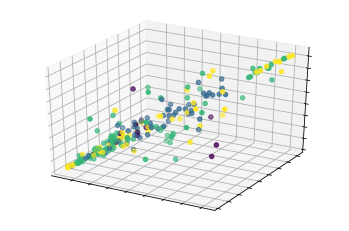

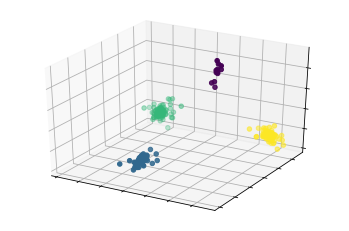

trainingData: (250, 3), trainingLabels: (250,)
testingData: (250, 3), testingLabels: (250,)
Iteration 1, loss = 1.42289366
Iteration 2, loss = 1.37808204
Iteration 3, loss = 1.33569471
Iteration 4, loss = 1.29412682
Iteration 5, loss = 1.25327475
Iteration 6, loss = 1.21328076
Iteration 7, loss = 1.17409536
Iteration 8, loss = 1.13580425
Iteration 9, loss = 1.09850192
Iteration 10, loss = 1.06183443
Iteration 11, loss = 1.02625545
Iteration 12, loss = 0.99141801
Iteration 13, loss = 0.95733897
Iteration 14, loss = 0.92445938
Iteration 15, loss = 0.89225701
Iteration 16, loss = 0.86087947
Iteration 17, loss = 0.83013770
Iteration 18, loss = 0.80001067
Iteration 19, loss = 0.77102553
Iteration 20, loss = 0.74252761
Iteration 21, loss = 0.71467120
Iteration 22, loss = 0.68759048
Iteration 23, loss = 0.66122765
Iteration 24, loss = 0.63544796
Iteration 25, loss = 0.61035538
Iteration 26, loss = 0.58595160
Iteration 27, loss = 0.56220376
Iteration 28, loss = 0.53919653
Iteration 29, loss = 

C:\Users\GaryNg\Anaconda3\lib\site-packages\sklearn\neural_network\multilayer_perceptron.py:562: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
       beta_2=0.999, early_stopping=False, epsilon=1e-08,
       hidden_layer_sizes=(100,), learning_rate='constant',
       learning_rate_init=0.001, max_iter=200, momentum=0.9,
       n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
       random_state=0, shuffle=True, solver='adam', tol=0.0001,
       validation_fraction=0.1, verbose=True, warm_start=False)
training accuracy: 1.0
testing accuracy: 0.988
confusion matrix: 
 [[ 13   0   1   0]
 [  1  41   0   0]
 [  0   1 117   0]
 [  0   0   0  76]]
              precision    recall  f1-score   support

           0       0.93      0.93      0.93        14
           1       0.98      0.98      0.98        42
           2       0.99      0.99      0.99       118
           3       1.00      1.00      1.00        76

   micro avg       0.99      0.99      0.99       250
   macro avg       0.97      0.97      0.97       250
weighted avg       0.99  

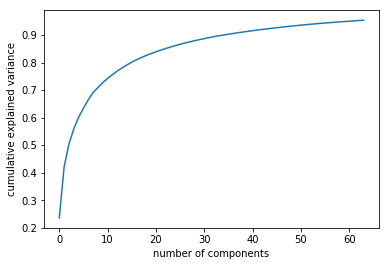

pca components: (64, 1024)


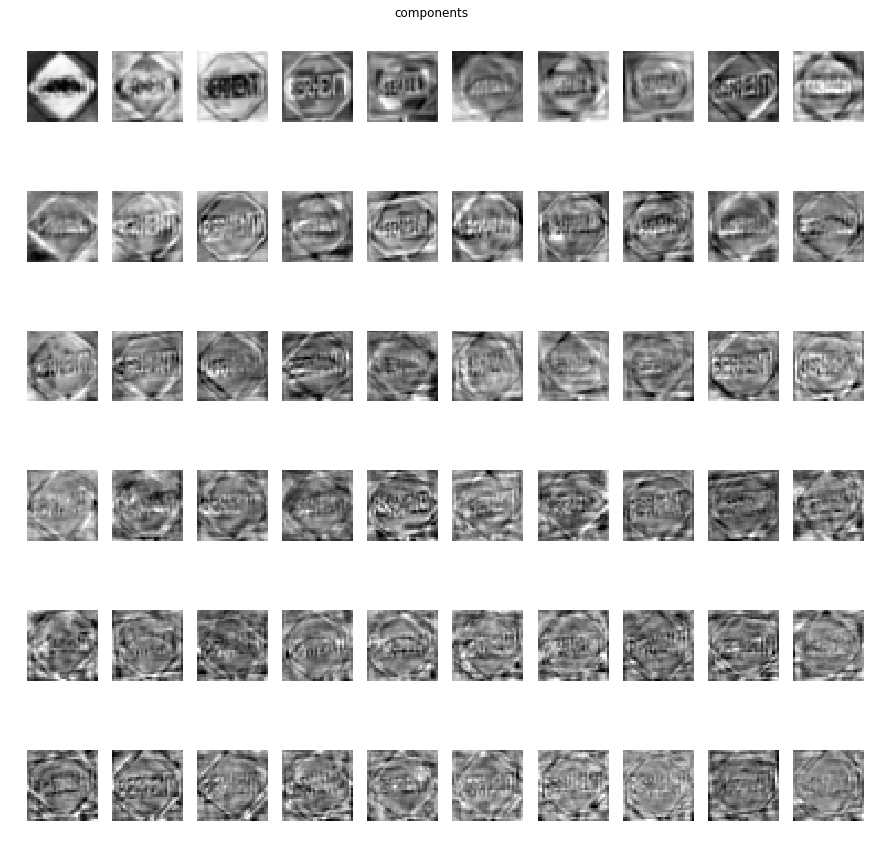

trainingData: (250, 64), trainingLabels: (250,)
testingData: (250, 64), testingLabels: (250,)


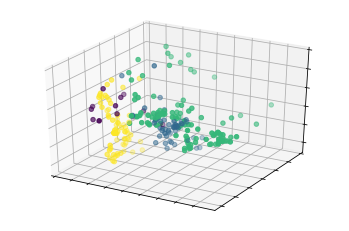

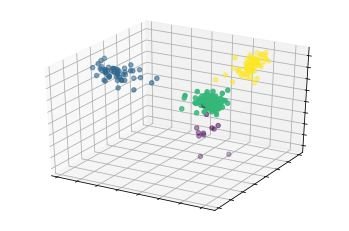

trainingData: (250, 3), trainingLabels: (250,)
testingData: (250, 3), testingLabels: (250,)
Iteration 1, loss = 1.31246071
Iteration 2, loss = 0.64566688
Iteration 3, loss = 0.29128101
Iteration 4, loss = 0.11840961
Iteration 5, loss = 0.04729502
Iteration 6, loss = 0.02043329
Iteration 7, loss = 0.00981577
Iteration 8, loss = 0.00555157
Iteration 9, loss = 0.00349337
Iteration 10, loss = 0.00239950
Iteration 11, loss = 0.00178487
Iteration 12, loss = 0.00142056
Iteration 13, loss = 0.00118115
Iteration 14, loss = 0.00102018
Iteration 15, loss = 0.00090841
Iteration 16, loss = 0.00082586
Iteration 17, loss = 0.00077207
Iteration 18, loss = 0.00072650
Iteration 19, loss = 0.00069445
Iteration 20, loss = 0.00066795
Iteration 21, loss = 0.00064792
Iteration 22, loss = 0.00062995
Iteration 23, loss = 0.00061679
Iteration 24, loss = 0.00060514
Iteration 25, loss = 0.00059532
Iteration 26, loss = 0.00058531
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopp

In [47]:
runAll(testSize=0.5)

# Data augmentation

In [48]:
def unpickleAugmentedData():
    images = pickle.load(open("./pkl/images_aug.pkl", "rb"))
    labels = pickle.load(open("./pkl/labels_aug.pkl", "rb"))
    return (images, labels)

def getAugmentedData():
    """Return unpicked data seperated into training and testing sets"""
    return train_test_split(*unpickleAugmentedData(), random_state=123)

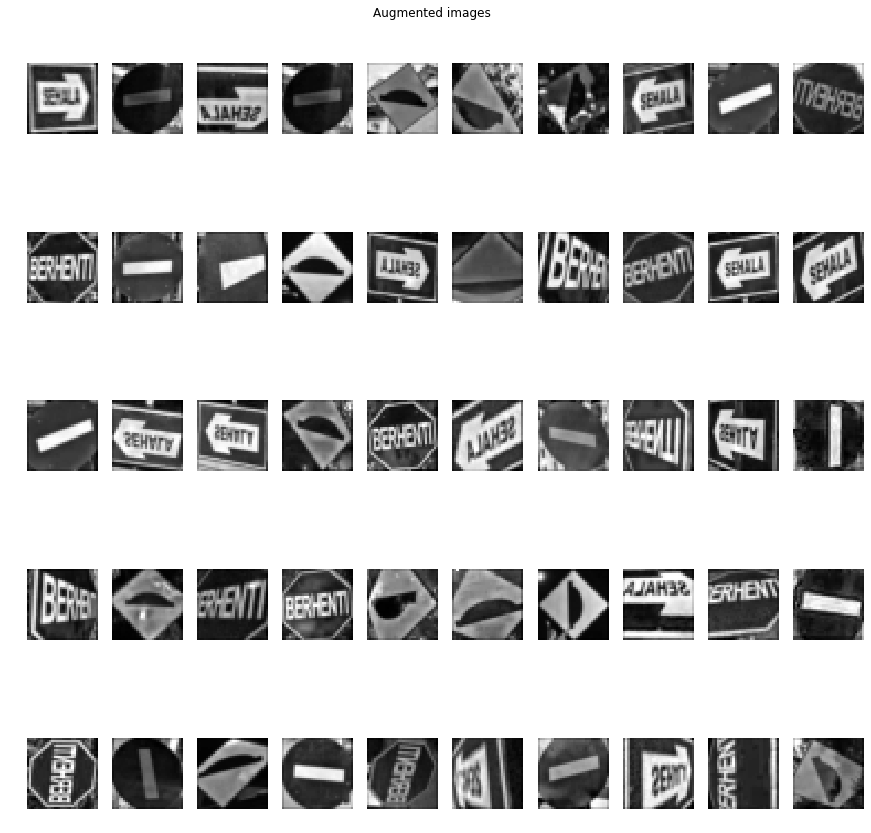

In [63]:
images, _ = unpickleAugmentedData()
showImages(np.array(sample(list(images), 50)).reshape(-1, 32, 32), "Augmented images", y=0.9)

--- Model 1 ---
trainingData: (900, 1024), trainingLabels: (900,)
testingData: (300, 1024), testingLabels: (300,)
optimal k: 1
training accuracy: 1.0
testing accuracy: 0.8
confusion matrix: 
 [[83  0  0  1]
 [24 44  0  3]
 [ 6  2 66  3]
 [20  1  0 47]]
              precision    recall  f1-score   support

           0       0.62      0.99      0.76        84
           1       0.94      0.62      0.75        71
           2       1.00      0.86      0.92        77
           3       0.87      0.69      0.77        68

   micro avg       0.80      0.80      0.80       300
   macro avg       0.86      0.79      0.80       300
weighted avg       0.85      0.80      0.80       300



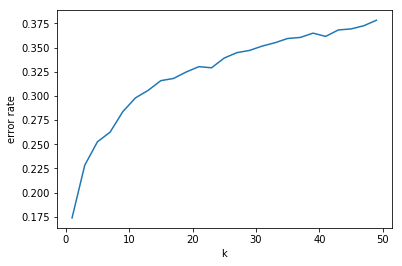

In [64]:
print("--- Model 1 ---")
trainKnn(*getAugmentedData())

--- Model 2 ---
trainingData: (900, 1024), trainingLabels: (900,)
testingData: (300, 1024), testingLabels: (300,)
total explained variance: 0.7727455300589892


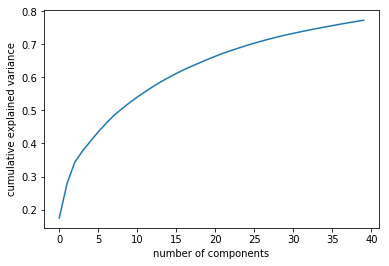

pca components: (40, 1024)


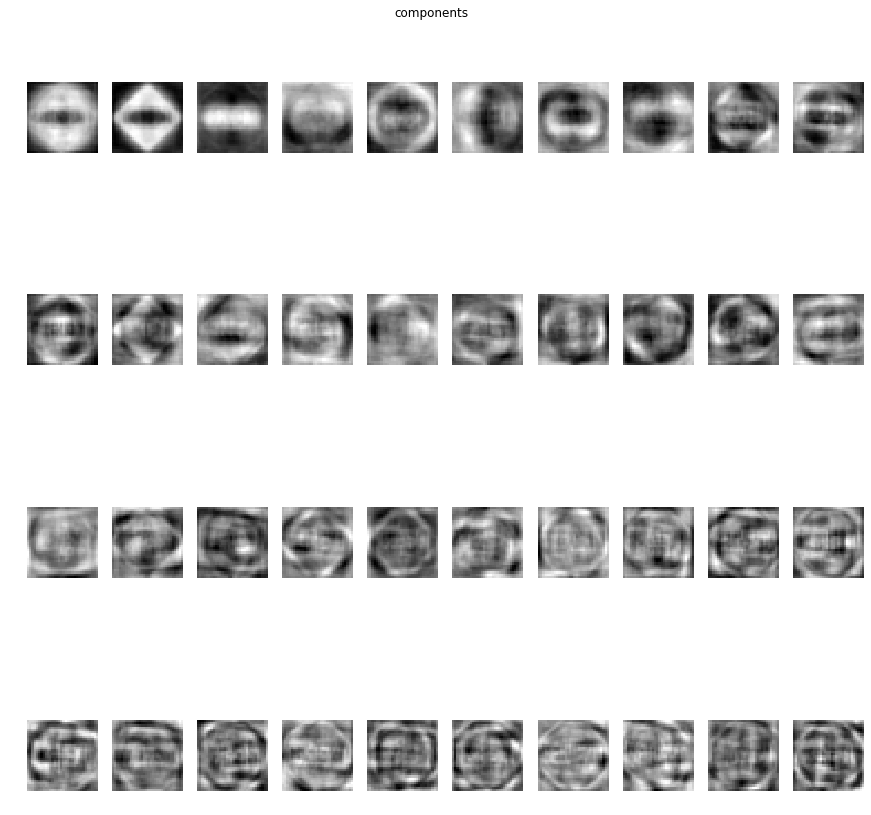

trainingData: (900, 40), trainingLabels: (900,)
testingData: (300, 40), testingLabels: (300,)
optimal k: 1
training accuracy: 1.0
testing accuracy: 0.86
confusion matrix: 
 [[78  0  1  5]
 [12 47  4  8]
 [ 3  1 68  5]
 [ 2  0  1 65]]
              precision    recall  f1-score   support

           0       0.82      0.93      0.87        84
           1       0.98      0.66      0.79        71
           2       0.92      0.88      0.90        77
           3       0.78      0.96      0.86        68

   micro avg       0.86      0.86      0.86       300
   macro avg       0.88      0.86      0.86       300
weighted avg       0.87      0.86      0.86       300



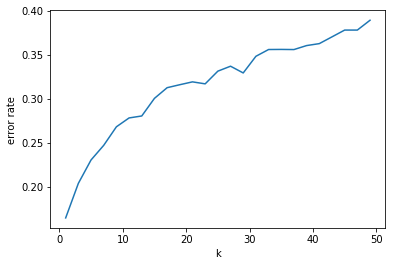

In [109]:
print("--- Model 2 ---")
trainKnn(*fitPca(*getAugmentedData(), components=40))

--- Model 3 ---
trainingData: (900, 1024), trainingLabels: (900,)
testingData: (300, 1024), testingLabels: (300,)


C:\Users\GaryNg\Anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")


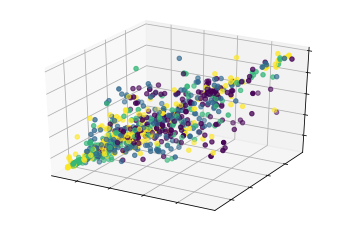

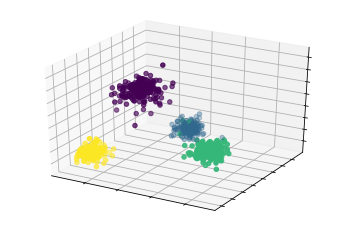

trainingData: (900, 3), trainingLabels: (900,)
testingData: (300, 3), testingLabels: (300,)
optimal k: 1
training accuracy: 1.0
testing accuracy: 0.4766666666666667
confusion matrix: 
 [[55  7  6 16]
 [21 27 14  9]
 [20  9 31 17]
 [19 10  9 30]]
              precision    recall  f1-score   support

           0       0.48      0.65      0.55        84
           1       0.51      0.38      0.44        71
           2       0.52      0.40      0.45        77
           3       0.42      0.44      0.43        68

   micro avg       0.48      0.48      0.48       300
   macro avg       0.48      0.47      0.47       300
weighted avg       0.48      0.48      0.47       300



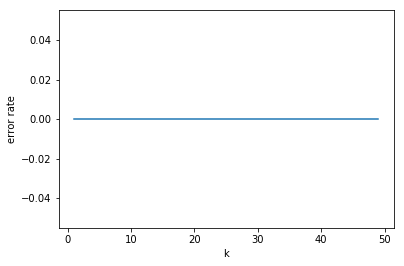

In [66]:
print("--- Model 3 ---")
trainKnn(*fitLda(*getAugmentedData()))

--- Model 4 ---
trainingData: (900, 1024), trainingLabels: (900,)
testingData: (300, 1024), testingLabels: (300,)
total explained variance: 0.790802143782052


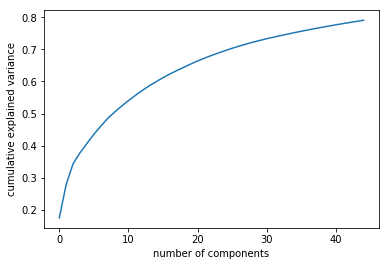

pca components: (45, 1024)


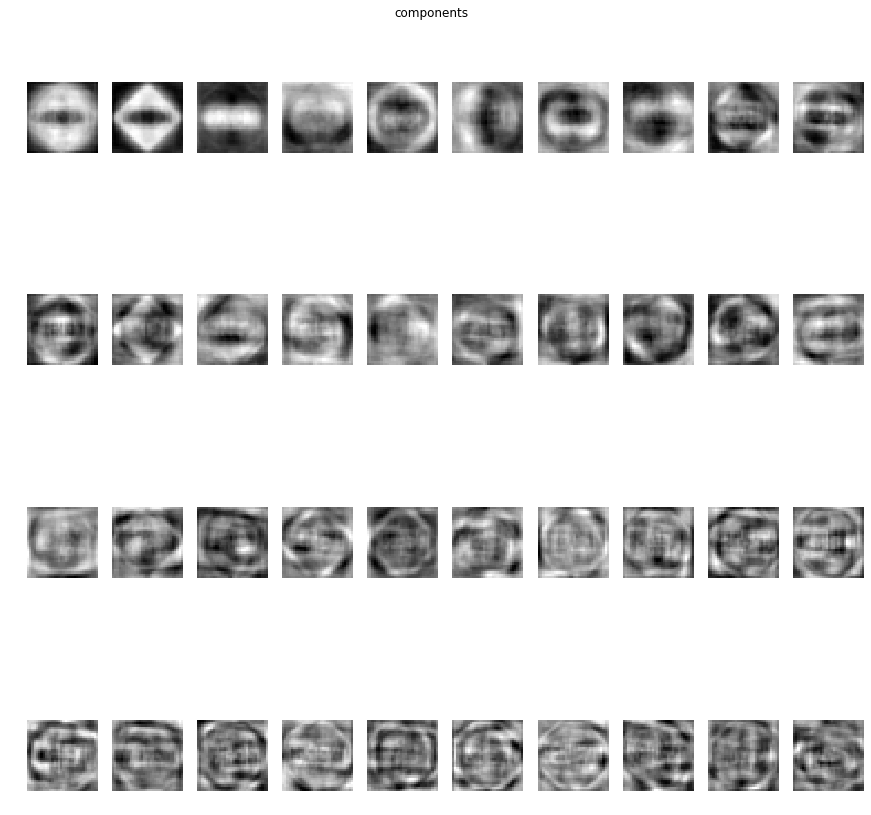

trainingData: (900, 45), trainingLabels: (900,)
testingData: (300, 45), testingLabels: (300,)


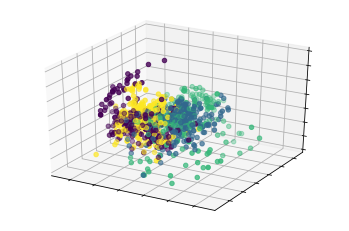

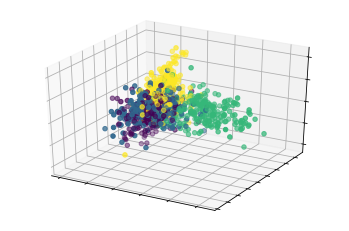

trainingData: (900, 3), trainingLabels: (900,)
testingData: (300, 3), testingLabels: (300,)
optimal k: 31
training accuracy: 0.8277777777777777
testing accuracy: 0.7366666666666667
confusion matrix: 
 [[60  8  0 16]
 [ 9 50  9  3]
 [ 2  8 64  3]
 [11  7  3 47]]
              precision    recall  f1-score   support

           0       0.73      0.71      0.72        84
           1       0.68      0.70      0.69        71
           2       0.84      0.83      0.84        77
           3       0.68      0.69      0.69        68

   micro avg       0.74      0.74      0.74       300
   macro avg       0.73      0.74      0.74       300
weighted avg       0.74      0.74      0.74       300



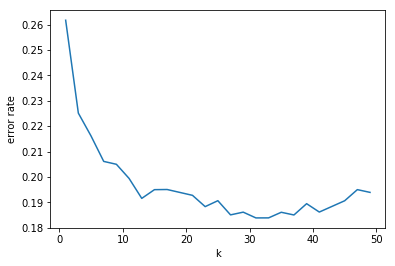

In [118]:
print("--- Model 4 ---")
trainKnn(*fitLda(*fitPca(*getAugmentedData(), components=45)))

--- Model 5 ---
trainingData: (900, 1024), trainingLabels: (900,)
testingData: (300, 1024), testingLabels: (300,)
total explained variance: 0.9234252523056466


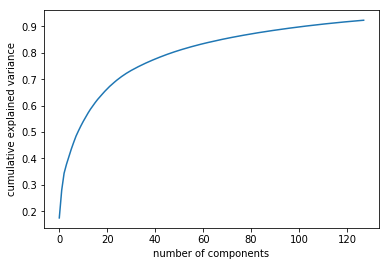

pca components: (128, 1024)


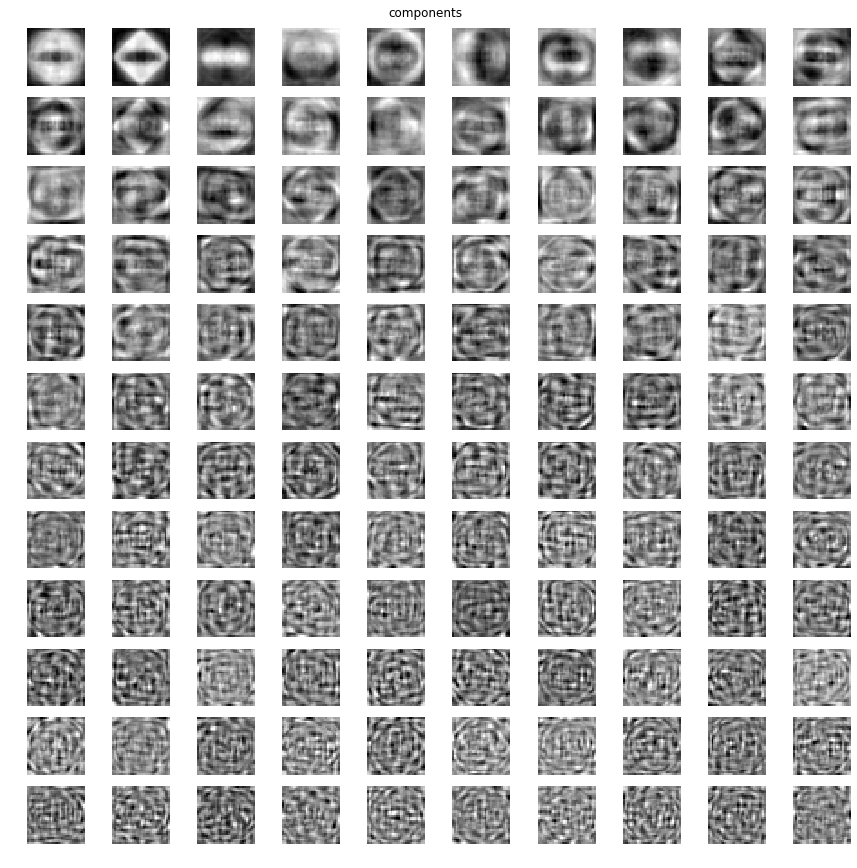

trainingData: (900, 128), trainingLabels: (900,)
testingData: (300, 128), testingLabels: (300,)
training accuracy: 0.9822222222222222
testing accuracy: 0.7266666666666667
confusion matrix: 
 [[65  6  2 11]
 [12 43 12  4]
 [ 5  9 61  2]
 [10  6  3 49]]
              precision    recall  f1-score   support

           0       0.71      0.77      0.74        84
           1       0.67      0.61      0.64        71
           2       0.78      0.79      0.79        77
           3       0.74      0.72      0.73        68

   micro avg       0.73      0.73      0.73       300
   macro avg       0.73      0.72      0.72       300
weighted avg       0.73      0.73      0.73       300



In [68]:
print("--- Model 5 ---")
trainSvm(*fitPca(*getAugmentedData(), components=128))

--- Model 6 ---
trainingData: (900, 1024), trainingLabels: (900,)
testingData: (300, 1024), testingLabels: (300,)
total explained variance: 0.8838914495470591


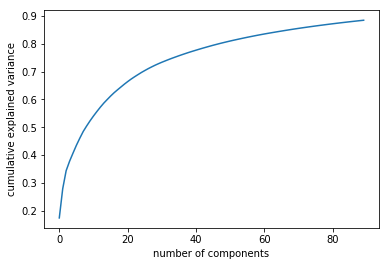

pca components: (90, 1024)


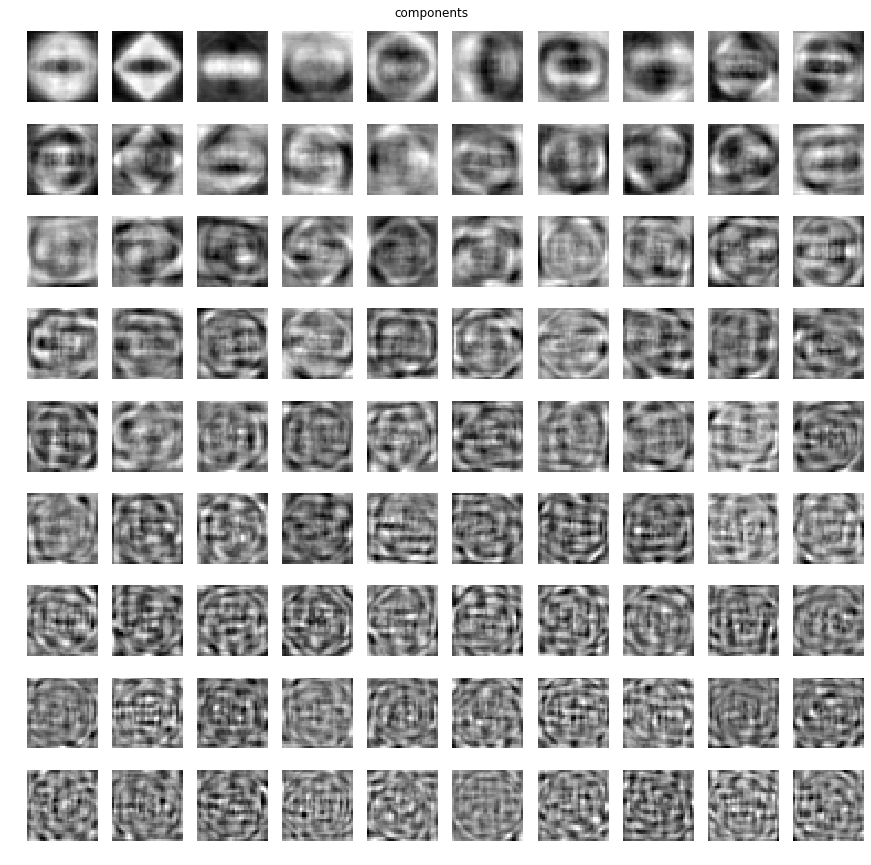

trainingData: (900, 90), trainingLabels: (900,)
testingData: (300, 90), testingLabels: (300,)


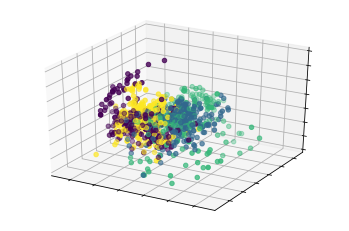

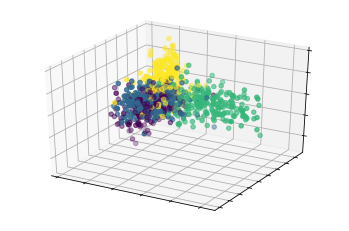

trainingData: (900, 3), trainingLabels: (900,)
testingData: (300, 3), testingLabels: (300,)
training accuracy: 0.84
testing accuracy: 0.7266666666666667
confusion matrix: 
 [[61  7  1 15]
 [ 5 50 10  6]
 [ 2  6 63  6]
 [13  6  5 44]]
              precision    recall  f1-score   support

           0       0.75      0.73      0.74        84
           1       0.72      0.70      0.71        71
           2       0.80      0.82      0.81        77
           3       0.62      0.65      0.63        68

   micro avg       0.73      0.73      0.73       300
   macro avg       0.72      0.72      0.72       300
weighted avg       0.73      0.73      0.73       300



In [127]:
print("--- Model 6 ---")
trainSvm(*fitLda(*fitPca(*getAugmentedData(), components=90)))

In [70]:
print("--- Model 7 ---")
trainMlp(*getAugmentedData())

--- Model 7 ---
trainingData: (900, 1024), trainingLabels: (900,)
testingData: (300, 1024), testingLabels: (300,)
Iteration 1, loss = 1.35154188
Iteration 2, loss = 0.49650054
Iteration 3, loss = 0.29579430
Iteration 4, loss = 0.15202952
Iteration 5, loss = 0.10412936
Iteration 6, loss = 0.05484465
Iteration 7, loss = 0.03364861
Iteration 8, loss = 0.01826231
Iteration 9, loss = 0.01252340
Iteration 10, loss = 0.00803611
Iteration 11, loss = 0.00566265
Iteration 12, loss = 0.00443914
Iteration 13, loss = 0.00352818
Iteration 14, loss = 0.00279497
Iteration 15, loss = 0.00243120
Iteration 16, loss = 0.00218756
Iteration 17, loss = 0.00196311
Iteration 18, loss = 0.00180930
Iteration 19, loss = 0.00169482
Iteration 20, loss = 0.00159892
Iteration 21, loss = 0.00151244
Iteration 22, loss = 0.00144458
Iteration 23, loss = 0.00138048
Iteration 24, loss = 0.00132519
Iteration 25, loss = 0.00127449
Iteration 26, loss = 0.00122991
Iteration 27, loss = 0.00119227
Iteration 28, loss = 0.00115656

--- Model 8 ---
trainingData: (900, 1024), trainingLabels: (900,)
testingData: (300, 1024), testingLabels: (300,)
total explained variance: 0.9235992604060625


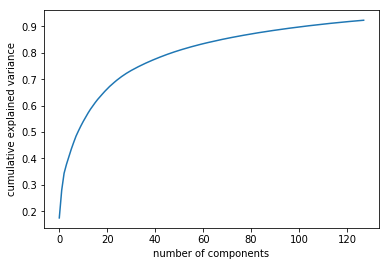

pca components: (128, 1024)


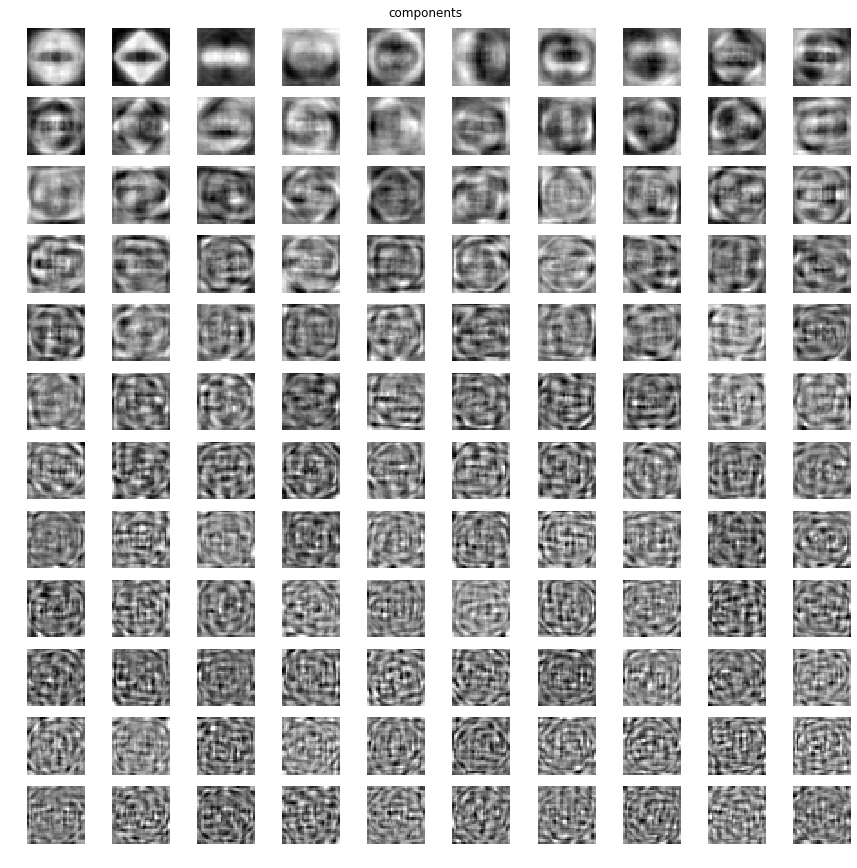

trainingData: (900, 128), trainingLabels: (900,)
testingData: (300, 128), testingLabels: (300,)
Iteration 1, loss = 1.26139698
Iteration 2, loss = 0.55945470
Iteration 3, loss = 0.28656853
Iteration 4, loss = 0.14386682
Iteration 5, loss = 0.07427431
Iteration 6, loss = 0.03957934
Iteration 7, loss = 0.02068012
Iteration 8, loss = 0.01125766
Iteration 9, loss = 0.00722166
Iteration 10, loss = 0.00474354
Iteration 11, loss = 0.00354336
Iteration 12, loss = 0.00285381
Iteration 13, loss = 0.00237755
Iteration 14, loss = 0.00206020
Iteration 15, loss = 0.00185795
Iteration 16, loss = 0.00169633
Iteration 17, loss = 0.00157563
Iteration 18, loss = 0.00147325
Iteration 19, loss = 0.00139308
Iteration 20, loss = 0.00132222
Iteration 21, loss = 0.00125916
Iteration 22, loss = 0.00120502
Iteration 23, loss = 0.00115624
Iteration 24, loss = 0.00111343
Iteration 25, loss = 0.00107216
Iteration 26, loss = 0.00103547
Iteration 27, loss = 0.00100277
Iteration 28, loss = 0.00097089
Iteration 29, los

In [71]:
print("--- Model 8 ---")
trainMlp(*fitPca(*getAugmentedData(), components=128))

--- Model 9 ---
trainingData: (900, 1024), trainingLabels: (900,)
testingData: (300, 1024), testingLabels: (300,)


C:\Users\GaryNg\Anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")


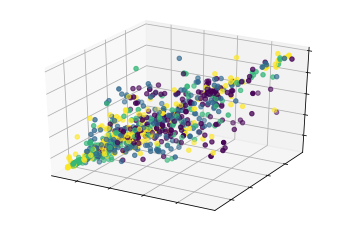

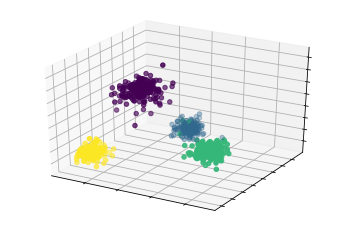

trainingData: (900, 3), trainingLabels: (900,)
testingData: (300, 3), testingLabels: (300,)
Iteration 1, loss = 0.78176426
Iteration 2, loss = 0.07771000
Iteration 3, loss = 0.00772085
Iteration 4, loss = 0.00213400
Iteration 5, loss = 0.00118128
Iteration 6, loss = 0.00085550
Iteration 7, loss = 0.00070513
Iteration 8, loss = 0.00060522
Iteration 9, loss = 0.00056849
Iteration 10, loss = 0.00051696
Iteration 11, loss = 0.00050107
Iteration 12, loss = 0.00047147
Iteration 13, loss = 0.00045711
Iteration 14, loss = 0.00044922
Iteration 15, loss = 0.00043888
Iteration 16, loss = 0.00042718
Iteration 17, loss = 0.00042067
Iteration 18, loss = 0.00041513
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
       beta_2=0.999, early_stopping=False, epsilon=1e-08,
       hidden_layer_sizes=(1024, 1024), learning_rate='constant',
       learning_rate_init=0.001, max_iter=200, mo

In [141]:
print("--- Model 9 ---")
trainMlp(*fitLda(*getAugmentedData()))

--- Model 10 ---
trainingData: (900, 1024), trainingLabels: (900,)
testingData: (300, 1024), testingLabels: (300,)
total explained variance: 0.9234791805381934


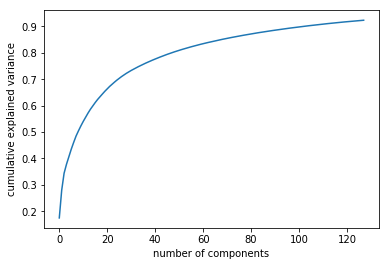

pca components: (128, 1024)


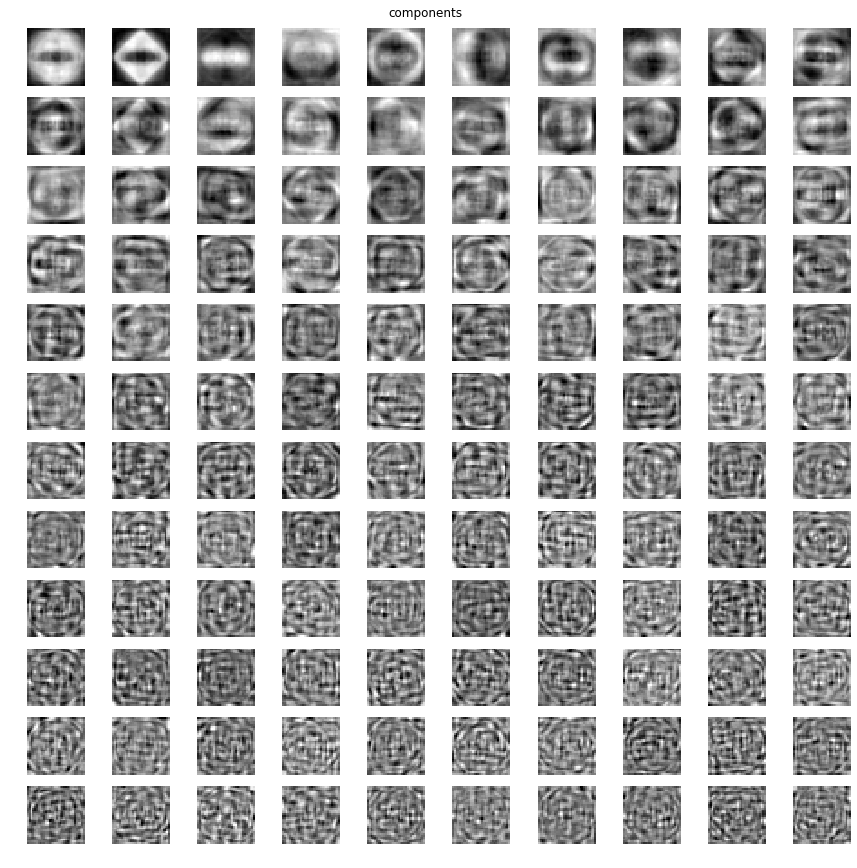

trainingData: (900, 128), trainingLabels: (900,)
testingData: (300, 128), testingLabels: (300,)


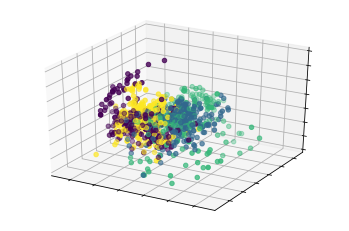

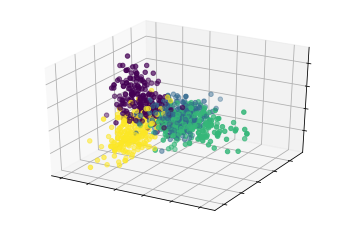

trainingData: (900, 3), trainingLabels: (900,)
testingData: (300, 3), testingLabels: (300,)
Iteration 1, loss = 0.95574992
Iteration 2, loss = 0.45584952
Iteration 3, loss = 0.42247576
Iteration 4, loss = 0.41833278
Iteration 5, loss = 0.40759649
Iteration 6, loss = 0.39845777
Iteration 7, loss = 0.39087872
Iteration 8, loss = 0.39088774
Iteration 9, loss = 0.38461050
Iteration 10, loss = 0.37997178
Iteration 11, loss = 0.37644285
Iteration 12, loss = 0.37595288
Iteration 13, loss = 0.37237338
Iteration 14, loss = 0.37350367
Iteration 15, loss = 0.37228014
Iteration 16, loss = 0.36902556
Iteration 17, loss = 0.36834605
Iteration 18, loss = 0.36737455
Iteration 19, loss = 0.36586517
Iteration 20, loss = 0.36817489
Iteration 21, loss = 0.36105690
Iteration 22, loss = 0.36294541
Iteration 23, loss = 0.36231090
Iteration 24, loss = 0.36228340
Iteration 25, loss = 0.35980453
Iteration 26, loss = 0.36310538
Iteration 27, loss = 0.35816197
Iteration 28, loss = 0.36075982
Iteration 29, loss = 

C:\Users\GaryNg\Anaconda3\lib\site-packages\sklearn\neural_network\multilayer_perceptron.py:562: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
       beta_2=0.999, early_stopping=False, epsilon=1e-08,
       hidden_layer_sizes=(1024, 1024), learning_rate='constant',
       learning_rate_init=0.001, max_iter=200, momentum=0.9,
       n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
       random_state=0, shuffle=True, solver='adam', tol=0.0001,
       validation_fraction=0.1, verbose=True, warm_start=False)
training accuracy: 0.9211111111111111
testing accuracy: 0.7333333333333333
confusion matrix: 
 [[61  6  2 15]
 [ 7 47 12  5]
 [ 1 10 59  7]
 [ 6  5  4 53]]
              precision    recall  f1-score   support

           0       0.81      0.73      0.77        84
           1       0.69      0.66      0.68        71
           2       0.77      0.77      0.77        77
           3       0.66      0.78      0.72        68

   micro avg       0.73      0.73      0.73       300
   macro avg       0.73      0.73      0.73       300
weighte

In [143]:
print("--- Model 10 ---")
trainMlp(*fitLda(*fitPca(*getAugmentedData(), components=128)))

In [146]:
def runAll(testSize = 0.25):
    data = train_test_split(*unpickleAugmentedData(), random_state=123, test_size=testSize)
    
    print("--- Model 1 ---")
    trainKnn(*data)
    print("--- Model 2 ---")
    trainKnn(*fitPca(*data, components=40))
    print("--- Model 3 ---")
    trainKnn(*fitLda(*data))
    print("--- Model 4 ---")
    trainKnn(*fitLda(*fitPca(*data, components=45)))
    print("--- Model 5 ---")
    trainSvm(*fitPca(*data, components=128))
    print("--- Model 6 ---")
    trainSvm(*fitLda(*fitPca(*data, components=90)))
    print("--- Model 7 ---")
    trainMlp(*data)
    print("--- Model 8 ---")
    trainMlp(*fitPca(*data, components=128))
    print("--- Model 9 ---")
    trainMlp(*fitLda(*data))
    print("--- Model 10 ---")
    trainMlp(*fitLda(*fitPca(*data, components=128)))

--- Model 1 ---
trainingData: (720, 1024), trainingLabels: (720,)
testingData: (480, 1024), testingLabels: (480,)
optimal k: 1
training accuracy: 1.0
testing accuracy: 0.8041666666666667
confusion matrix: 
 [[125   1   2   3]
 [ 31  79   0   3]
 [ 11   3 101   5]
 [ 33   0   2  81]]
              precision    recall  f1-score   support

           0       0.62      0.95      0.76       131
           1       0.95      0.70      0.81       113
           2       0.96      0.84      0.90       120
           3       0.88      0.70      0.78       116

   micro avg       0.80      0.80      0.80       480
   macro avg       0.85      0.80      0.81       480
weighted avg       0.85      0.80      0.81       480

--- Model 2 ---
trainingData: (720, 1024), trainingLabels: (720,)
testingData: (480, 1024), testingLabels: (480,)
total explained variance: 0.7760278631785977


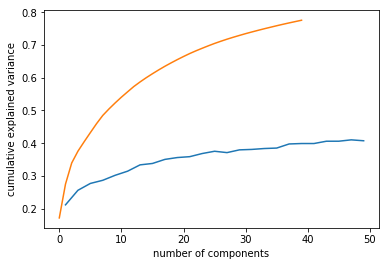

pca components: (40, 1024)


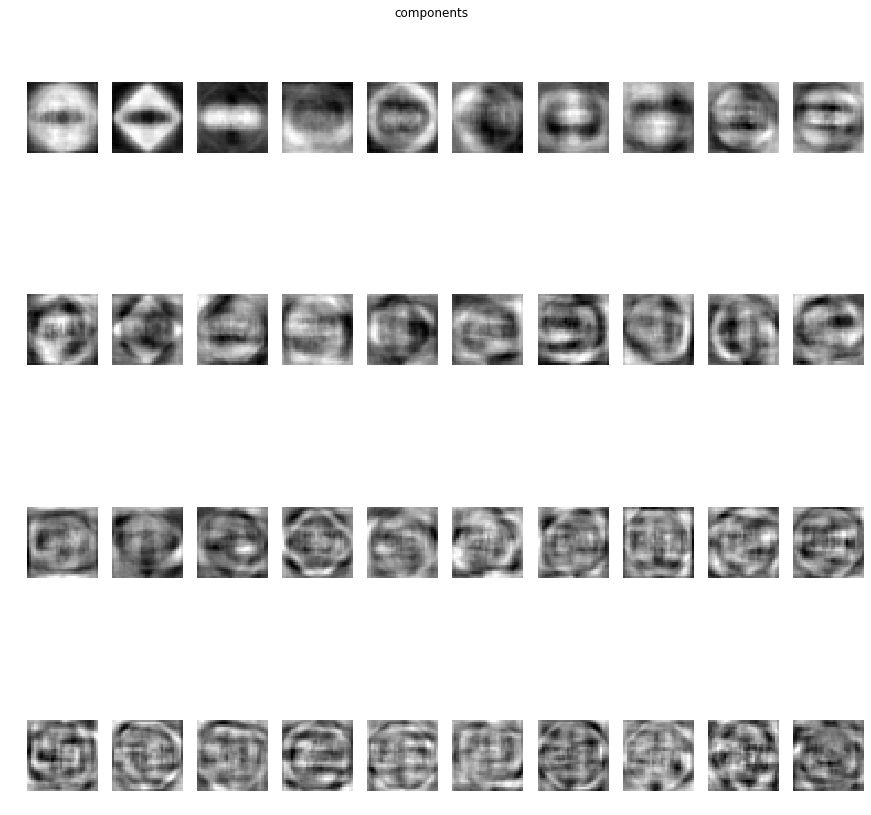

trainingData: (720, 40), trainingLabels: (720,)
testingData: (480, 40), testingLabels: (480,)
optimal k: 1
training accuracy: 1.0
testing accuracy: 0.8395833333333333
confusion matrix: 
 [[116   3   2  10]
 [ 22  79   6   6]
 [  9   4 101   6]
 [  6   0   3 107]]
              precision    recall  f1-score   support

           0       0.76      0.89      0.82       131
           1       0.92      0.70      0.79       113
           2       0.90      0.84      0.87       120
           3       0.83      0.92      0.87       116

   micro avg       0.84      0.84      0.84       480
   macro avg       0.85      0.84      0.84       480
weighted avg       0.85      0.84      0.84       480

--- Model 3 ---
trainingData: (720, 1024), trainingLabels: (720,)
testingData: (480, 1024), testingLabels: (480,)


C:\Users\GaryNg\Anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
C:\Users\GaryNg\Anaconda3\lib\site-packages\matplotlib\figure.py:98: MatplotlibDeprecationWarning: 
Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  "Adding an axes using the same arguments as a previous axes "


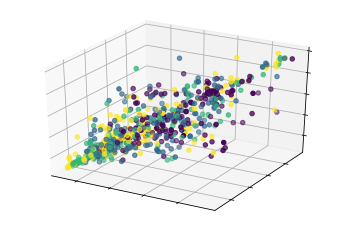

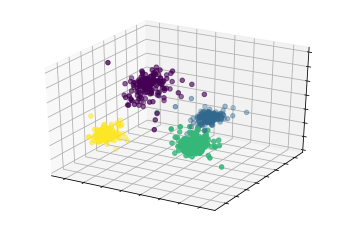

trainingData: (720, 3), trainingLabels: (720,)
testingData: (480, 3), testingLabels: (480,)
optimal k: 3
training accuracy: 0.9972222222222222
testing accuracy: 0.5354166666666667
confusion matrix: 
 [[92 20 11  8]
 [29 47 21 16]
 [20 12 78 10]
 [36 16 24 40]]
              precision    recall  f1-score   support

           0       0.52      0.70      0.60       131
           1       0.49      0.42      0.45       113
           2       0.58      0.65      0.61       120
           3       0.54      0.34      0.42       116

   micro avg       0.54      0.54      0.54       480
   macro avg       0.53      0.53      0.52       480
weighted avg       0.53      0.54      0.52       480

--- Model 4 ---
trainingData: (720, 1024), trainingLabels: (720,)
testingData: (480, 1024), testingLabels: (480,)
total explained variance: 0.7943797720610103


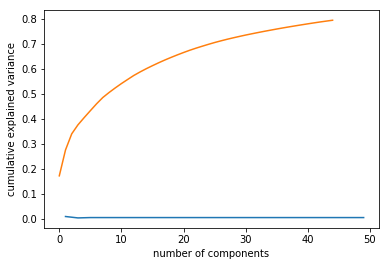

pca components: (45, 1024)


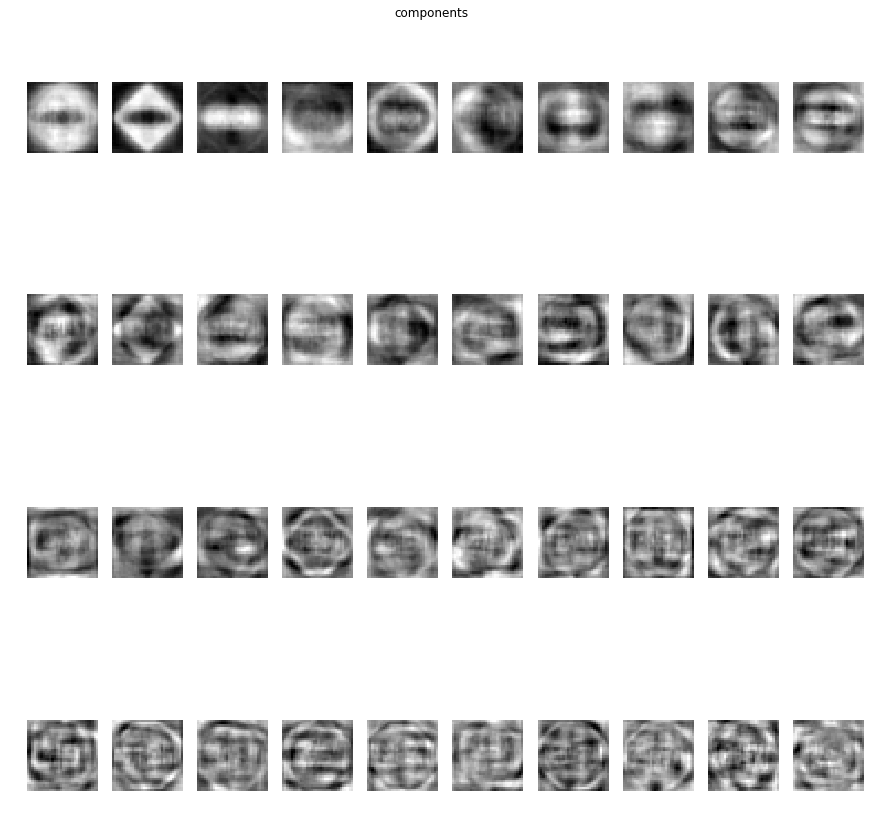

trainingData: (720, 45), trainingLabels: (720,)
testingData: (480, 45), testingLabels: (480,)


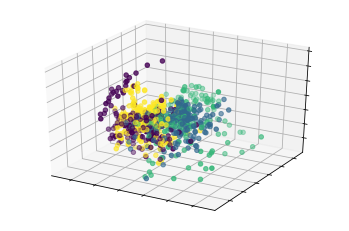

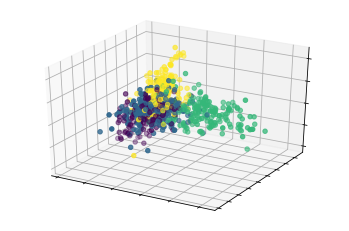

trainingData: (720, 3), trainingLabels: (720,)
testingData: (480, 3), testingLabels: (480,)
optimal k: 29
training accuracy: 0.825
testing accuracy: 0.7625
confusion matrix: 
 [[ 95  13   2  21]
 [ 14  88   8   3]
 [  2  14 100   4]
 [ 17  13   3  83]]
              precision    recall  f1-score   support

           0       0.74      0.73      0.73       131
           1       0.69      0.78      0.73       113
           2       0.88      0.83      0.86       120
           3       0.75      0.72      0.73       116

   micro avg       0.76      0.76      0.76       480
   macro avg       0.77      0.76      0.76       480
weighted avg       0.77      0.76      0.76       480

--- Model 5 ---
trainingData: (720, 1024), trainingLabels: (720,)
testingData: (480, 1024), testingLabels: (480,)
total explained variance: 0.9290803675188927


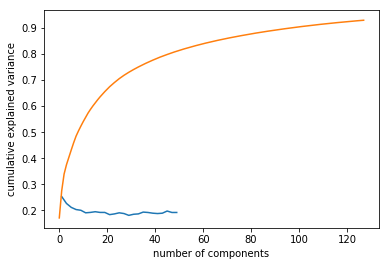

pca components: (128, 1024)


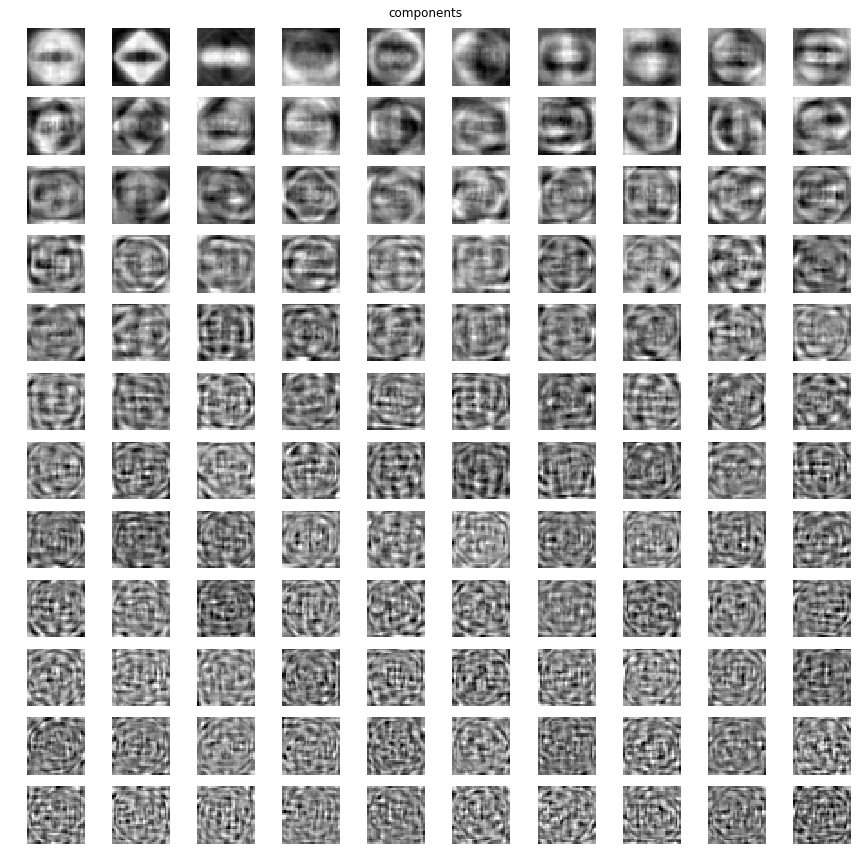

trainingData: (720, 128), trainingLabels: (720,)
testingData: (480, 128), testingLabels: (480,)
training accuracy: 0.9958333333333333
testing accuracy: 0.70625
confusion matrix: 
 [[99  9  3 20]
 [22 74 13  4]
 [ 6 15 93  6]
 [24 14  5 73]]
              precision    recall  f1-score   support

           0       0.66      0.76      0.70       131
           1       0.66      0.65      0.66       113
           2       0.82      0.78      0.79       120
           3       0.71      0.63      0.67       116

   micro avg       0.71      0.71      0.71       480
   macro avg       0.71      0.70      0.71       480
weighted avg       0.71      0.71      0.71       480

--- Model 6 ---
trainingData: (720, 1024), trainingLabels: (720,)
testingData: (480, 1024), testingLabels: (480,)
total explained variance: 0.8890576383549031


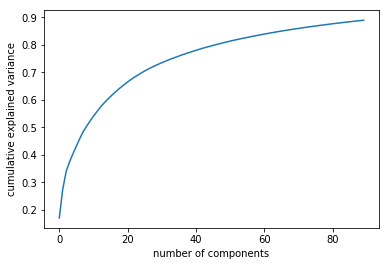

pca components: (90, 1024)


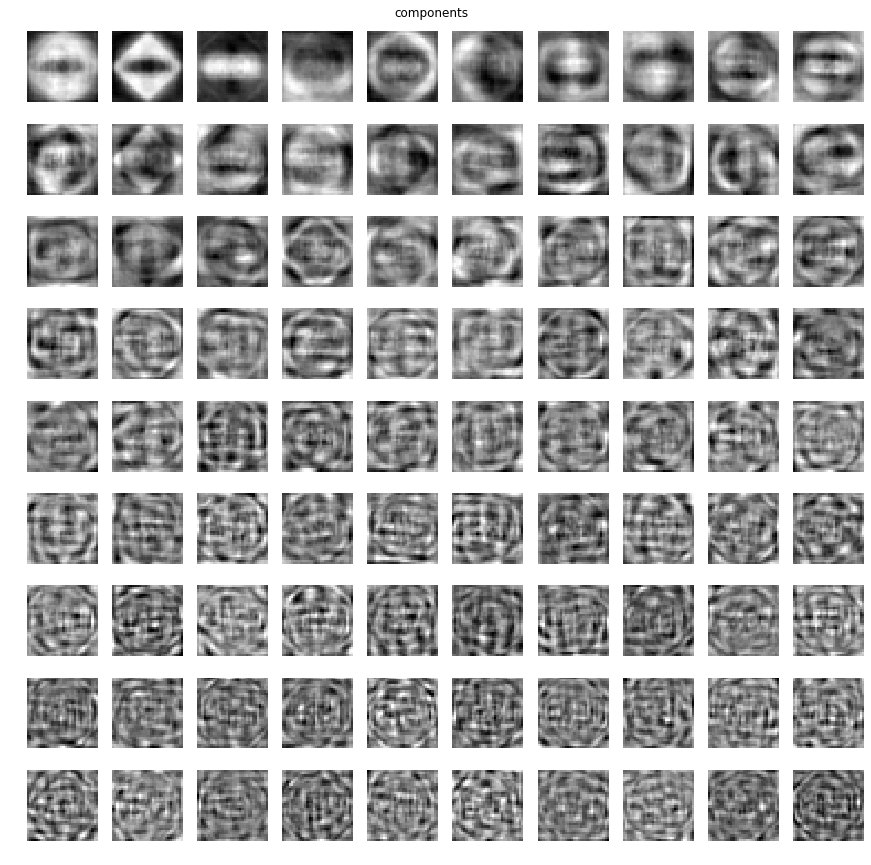

trainingData: (720, 90), trainingLabels: (720,)
testingData: (480, 90), testingLabels: (480,)


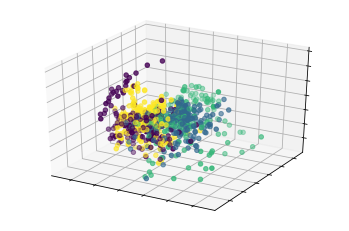

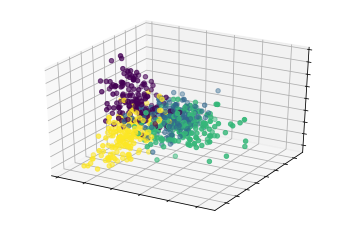

trainingData: (720, 3), trainingLabels: (720,)
testingData: (480, 3), testingLabels: (480,)
training accuracy: 0.8416666666666667
testing accuracy: 0.7520833333333333
confusion matrix: 
 [[ 91  10   5  25]
 [  8  84  15   6]
 [  5   8 103   4]
 [ 14  13   6  83]]
              precision    recall  f1-score   support

           0       0.77      0.69      0.73       131
           1       0.73      0.74      0.74       113
           2       0.80      0.86      0.83       120
           3       0.70      0.72      0.71       116

   micro avg       0.75      0.75      0.75       480
   macro avg       0.75      0.75      0.75       480
weighted avg       0.75      0.75      0.75       480

--- Model 7 ---
trainingData: (720, 1024), trainingLabels: (720,)
testingData: (480, 1024), testingLabels: (480,)
Iteration 1, loss = 1.47602339
Iteration 2, loss = 0.58621561
Iteration 3, loss = 0.26229212
Iteration 4, loss = 0.20554925
Iteration 5, loss = 0.10561282
Iteration 6, loss = 0.05289469
I

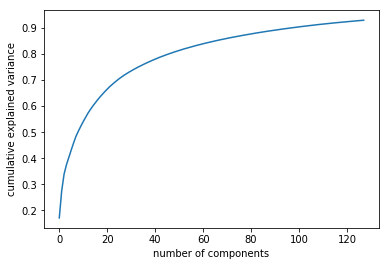

pca components: (128, 1024)


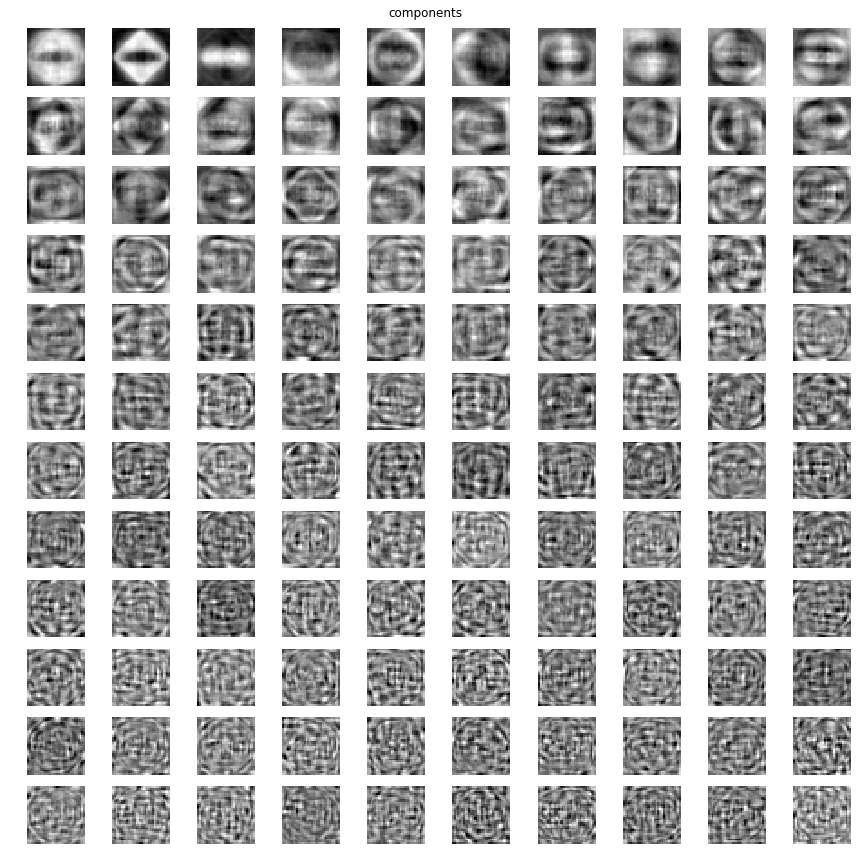

trainingData: (720, 128), trainingLabels: (720,)
testingData: (480, 128), testingLabels: (480,)
Iteration 1, loss = 1.54625542
Iteration 2, loss = 0.89981013
Iteration 3, loss = 0.58054572
Iteration 4, loss = 0.33056398
Iteration 5, loss = 0.19760581
Iteration 6, loss = 0.12300960
Iteration 7, loss = 0.06351247
Iteration 8, loss = 0.03919718
Iteration 9, loss = 0.02191894
Iteration 10, loss = 0.01297830
Iteration 11, loss = 0.00947660
Iteration 12, loss = 0.00688095
Iteration 13, loss = 0.00501165
Iteration 14, loss = 0.00390247
Iteration 15, loss = 0.00328297
Iteration 16, loss = 0.00284220
Iteration 17, loss = 0.00252495
Iteration 18, loss = 0.00227825
Iteration 19, loss = 0.00207558
Iteration 20, loss = 0.00191991
Iteration 21, loss = 0.00179986
Iteration 22, loss = 0.00169454
Iteration 23, loss = 0.00160660
Iteration 24, loss = 0.00153273
Iteration 25, loss = 0.00146630
Iteration 26, loss = 0.00140562
Iteration 27, loss = 0.00135137
Iteration 28, loss = 0.00130308
Iteration 29, los

C:\Users\GaryNg\Anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")


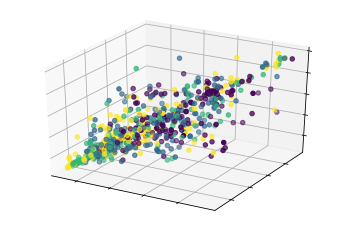

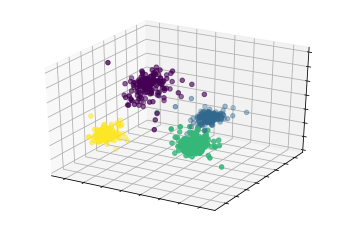

trainingData: (720, 3), trainingLabels: (720,)
testingData: (480, 3), testingLabels: (480,)
Iteration 1, loss = 0.90917457
Iteration 2, loss = 0.16777627
Iteration 3, loss = 0.03337685
Iteration 4, loss = 0.01637683
Iteration 5, loss = 0.01361828
Iteration 6, loss = 0.01278697
Iteration 7, loss = 0.01249617
Iteration 8, loss = 0.01196479
Iteration 9, loss = 0.01130730
Iteration 10, loss = 0.01043138
Iteration 11, loss = 0.01002519
Iteration 12, loss = 0.00953023
Iteration 13, loss = 0.00894275
Iteration 14, loss = 0.00853150
Iteration 15, loss = 0.00811581
Iteration 16, loss = 0.00759440
Iteration 17, loss = 0.00733777
Iteration 18, loss = 0.00703457
Iteration 19, loss = 0.00675293
Iteration 20, loss = 0.00650508
Iteration 21, loss = 0.00633842
Iteration 22, loss = 0.00604022
Iteration 23, loss = 0.00582080
Iteration 24, loss = 0.00578480
Iteration 25, loss = 0.00556815
Iteration 26, loss = 0.00535473
Iteration 27, loss = 0.00520991
Iteration 28, loss = 0.00494877
Iteration 29, loss = 

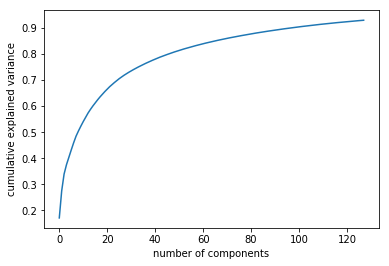

pca components: (128, 1024)


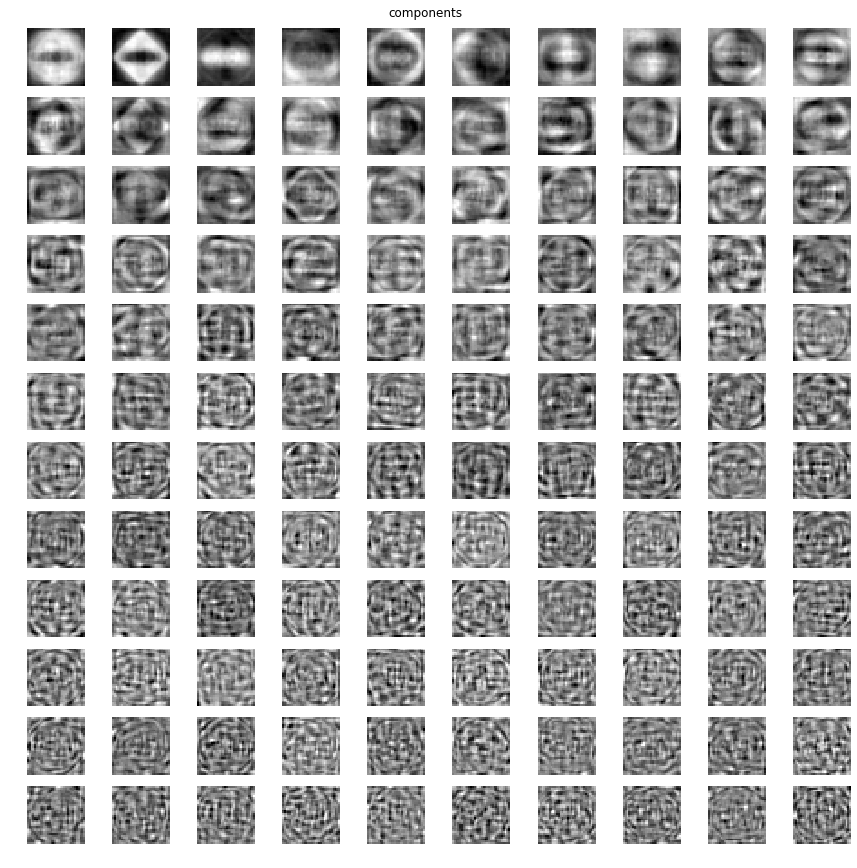

trainingData: (720, 128), trainingLabels: (720,)
testingData: (480, 128), testingLabels: (480,)


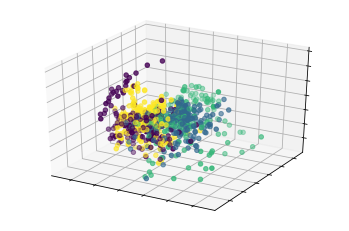

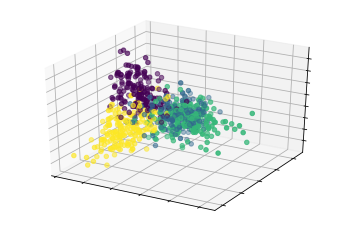

trainingData: (720, 3), trainingLabels: (720,)
testingData: (480, 3), testingLabels: (480,)
Iteration 1, loss = 1.02981327
Iteration 2, loss = 0.47433245
Iteration 3, loss = 0.37740764
Iteration 4, loss = 0.37732018
Iteration 5, loss = 0.37198401
Iteration 6, loss = 0.36466301
Iteration 7, loss = 0.35097083
Iteration 8, loss = 0.34696205
Iteration 9, loss = 0.34256429
Iteration 10, loss = 0.34211853
Iteration 11, loss = 0.34144038
Iteration 12, loss = 0.33613148
Iteration 13, loss = 0.33181166
Iteration 14, loss = 0.32947555
Iteration 15, loss = 0.32744083
Iteration 16, loss = 0.32580543
Iteration 17, loss = 0.32324200
Iteration 18, loss = 0.32347231
Iteration 19, loss = 0.31922149
Iteration 20, loss = 0.31934619
Iteration 21, loss = 0.31751195
Iteration 22, loss = 0.31502836
Iteration 23, loss = 0.31499656
Iteration 24, loss = 0.31129709
Iteration 25, loss = 0.30992488
Iteration 26, loss = 0.30981643
Iteration 27, loss = 0.30572001
Iteration 28, loss = 0.30553384
Iteration 29, loss = 

In [147]:
runAll(testSize=0.4)

# tSNE

In [84]:
def tsneVisualize(data, labels):
    tsne = TSNE(verbose=1, random_state=0, n_iter=2000, n_components=3)
    data = tsne.fit_transform(data)

    scatter3d(data[:, 0], data[:, 1], data[:, 2], labels)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 500 samples in 0.025s...
[t-SNE] Computed neighbors for 500 samples in 0.576s...
[t-SNE] Computed conditional probabilities for sample 500 / 500
[t-SNE] Mean sigma: 2.517696
[t-SNE] KL divergence after 250 iterations with early exaggeration: 90.198715
[t-SNE] KL divergence after 2000 iterations: 0.708619


<IPython.core.display.Javascript object>


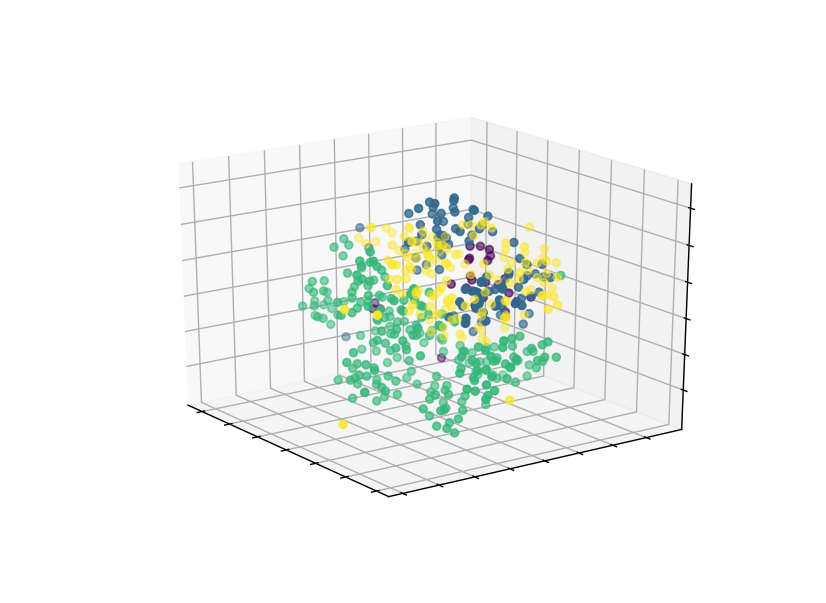

In [85]:
%matplotlib notebook
tsneVisualize(*unpickleData())
%matplotlib inline

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1200 samples in 0.085s...
[t-SNE] Computed neighbors for 1200 samples in 3.200s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1200
[t-SNE] Computed conditional probabilities for sample 1200 / 1200
[t-SNE] Mean sigma: 2.137217
[t-SNE] KL divergence after 250 iterations with early exaggeration: 78.764046
[t-SNE] KL divergence after 2000 iterations: 1.173605


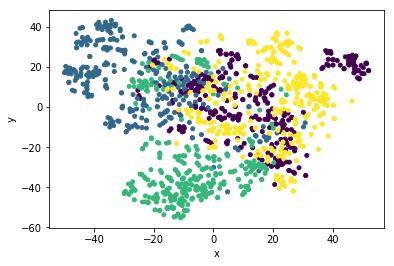

In [184]:
tsneVisualize(*unpickleAugmentedData())